In [28]:
%load_ext line_profiler

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [138]:
import pandas as pd
import os, sys
import numpy as np
import math
from matplotlib import pyplot as plt
from IPython.display import display
from PIL import Image
import PIL
import s3fs 
from sklearn import datasets,linear_model
import cv2
import time

isPlot=True
isPlotDP=False

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])


def axbFit(x_train,y_train):
    regr=linear_model.LinearRegression()
    regr.fit(x_train.reshape(-1, 1),y_train.reshape(-1, 1))  
    r_squared = regr.score(x_train.reshape(-1, 1),y_train.reshape(-1, 1))
    #r_squared = regr.score(x_train, y_train)
    #print('y=ax+b的 a係數:',regr.coef_)
    #print('y=ax+b的 b截距:',regr.intercept_ )
    #print('y=ax+b的 r_squared:',r_squared )
    return regr.coef_, r_squared

def imgWrapA(orgImg,a):
    column=orgImg.shape[1]
    row=orgImg.shape[0]
    #plt.plot( int(column/2),int(row/2),'rx')#fix
    #plt.plot( int(column/2),int(row/4),'bx')#fix
    #plt.plot( int(column/4),int(row/2-column/4*a),'go')#offset
    pts1 = np.float32([[column/2,row/2],[column/2,row/4],[column/4,row/2-column/4*a]])
    pts2 = np.float32([[column/2,row/2],[column/2,row/4],[column/4,row/2]])
    M = cv2.getAffineTransform(pts1,pts2)
    imgWarpAffine = cv2.warpAffine(orgImg,M,(column,row))
    return imgWarpAffine
    

#def tb()
#217606.0 108803.0     68.2      reward, prev=getTrelis(img, row, column, side, orgImg)

def getTrelis(img, row, column, side, orgImg):
    thread=np.mean(img)
    print(thread)
    reward= np.zeros((row,column),dtype=float)
    prev= np.zeros((row,column),dtype=float)
    for j in range(0,row):  # for each reward
        prev[j,0]=0;
        if img[j,0] < thread :
            reward[j,0]=0
        else:
            reward[j,0]=100

    columnTrace=column
    #columnTrace=4
    for i in range(1, columnTrace):  # for each stage
        for j in range(0,row):  # for each reward
            if  orgImg[j,i]==0 : # white
                reward[j,i] = reward[j,i-1]
                prev[j,i] =j #debug of edge :0
            else: #black
                newReward=np.array(reward[:,i-1], copy=True)
                down=max(j-side,0)
                up=min(j+side,row)
                for k in range(down,up):
                    newReward[k]=newReward[k]-abs(orgImg[k,i-1]-orgImg[j,i])
                relativeMaxIndex=np.argmax(newReward[down:up])
                maxreward=newReward[relativeMaxIndex+down]
                reward[j,i] = maxreward+img[j,i]
                prev[j,i] = relativeMaxIndex+down
    if isPlotDP:
        plt.imshow(reward)
        plt.show()
        plt.imshow(prev)
        plt.show()  
        print(reward.shape)
        print(prev.shape)
    return reward, prev

def v3GetTrelis(img, row, column, side, orgImg):
    img=img
    #x=np.ones((img.shape[0],img.shape[1],2))*20.00
    #x[:,:,0]=img
    #img=np.min(x,axis=2)
    #thread=np.mean(img)
    #print(thread)
    inc=np.array(range(0-2,row-2))#2 = side
    reward= np.zeros((row,column),dtype=float)
    prev= np.zeros((row,column),dtype=float)
    orgImgM= np.ones((row,column,side*2+1),dtype=float)*(-2)
    columnTrace=column
    #columnTrace=4
    
    rewardM= np.ones((row,side*2+1),dtype=float)*(-1000)
    colInx=0
    orgImgM[1:  ,:,1]=orgImg[ :-1,:]+50.0
    orgImgM[ :  ,:,2]=orgImg[ :  ,:]
    orgImgM[ :-1,:,3]=orgImg[1:  ,:]+50.0
    #for i in range(0, 2*side+1):
    for i in range(1, columnTrace):  # for each stage
        colInx=i-1
        rewardM[1:  ,1]=reward[ :-1,colInx]
        rewardM[ :  ,2]=reward[ :  ,colInx]
        rewardM[ :-1,3]=reward[1:  ,colInx]
        vNewReward=rewardM-abs(orgImgM[:,colInx,:]-orgImg[:,i, None])
        vRelativeMaxIndex=np.argmax(vNewReward,axis=1)
        reward[:,i]=np.max(vNewReward,axis=1)+img[:,i]
        prev[:,i]=inc+vRelativeMaxIndex
        #print(vRelativeMaxIndex)
    if isPlotDP:
        plt.imshow(reward)
        plt.show()
        plt.imshow(prev)
        plt.show()  
        print(reward.shape)
        print(prev.shape)
    return reward, prev


def vvGetTrelis(img, row, column, side, orgImg):
    thread=np.mean(img)
    print(thread)
    inc=np.array(range(0-2,row-2))#2 = side
    reward= np.zeros((row,column),dtype=float)
    prev= np.zeros((row,column),dtype=float)
    orgImgM= np.ones((row,column,side*2+1),dtype=float)*(-200)
    '''
    for j in range(0,row):  # for each reward
        prev[j,0]=0;
        if img[j,0] < thread :
            reward[j,0]=0
        else:
            reward[j,0]=100
    '''
    columnTrace=column
    #columnTrace=4
    
    rewardM= np.ones((row,side*2+1),dtype=float)*(-1000)
    colInx=0
    orgImgM[2:  ,:,0]=orgImg[ :-2,:]
    orgImgM[1:  ,:,1]=orgImg[ :-1,:]
    orgImgM[ :  ,:,2]=orgImg[ :  ,:]
    orgImgM[ :-1,:,3]=orgImg[1:  ,:]
    orgImgM[ :-2,:,4]=orgImg[2:  ,:]
    #for i in range(0, 2*side+1):
    for i in range(1, columnTrace):  # for each stage
        colInx=i-1
        rewardM[2:  ,0]=reward[ :-2,colInx]
        rewardM[1:  ,1]=reward[ :-1,colInx]
        rewardM[ :  ,2]=reward[ :  ,colInx]
        rewardM[ :-1,3]=reward[1:  ,colInx]
        rewardM[ :-2,4]=reward[2:  ,colInx]
        vNewReward=rewardM-abs(orgImgM[:,colInx,:]-orgImg[:,i, None])
        vRelativeMaxIndex=np.argmax(vNewReward,axis=1)
        reward[:,i]=np.max(vNewReward,axis=1)+img[:,i]
        prev[:,i]=inc+vRelativeMaxIndex
        #print(vRelativeMaxIndex)
    if isPlotDP:
        plt.imshow(reward)
        plt.show()
        plt.imshow(prev)
        plt.show()  
        print(reward.shape)
        print(prev.shape)
    return reward, prev

# 10799.0   5399.5     10.4      reward, prev=vvGetTrelis(img, row, column, side, orgImg)
#217606.0 108803.0     68.2      reward, prev=getTrelis(img, row, column, side, orgImg)
def vGetTrelis(img, row, column, side, orgImg):
    thread=np.mean(img)
    print(thread)
    reward= np.zeros((row,column),dtype=float)
    prev= np.zeros((row,column),dtype=float)
    for j in range(0,row):  # for each reward
        prev[j,0]=0;
        if img[j,0] < thread :
            reward[j,0]=0
        else:
            reward[j,0]=100
    columnTrace=column
    #columnTrace=4
    for i in range(1, columnTrace):  # for each stage
        for j in range(0,row):  # for each reward
            if  orgImg[j,i]==0 : # white
                reward[j,i] = reward[j,i-1]
                prev[j,i] =j #debug of edge :0
            else: #black
                newReward=np.array(reward[:,i-1], copy=True)
                vNewReward=np.array(reward[:,i-1], copy=True)
                down=max(j-side,0)
                up=min(j+side,row)
                #newReward=newReward+img[j,i]
                vNewReward=vNewReward-abs(orgImg[:,i-1]-orgImg[j,i])
                vRelativeMaxIndex=np.argmax(vNewReward[down:up])
                #for k in range(down,up):
                #    newReward[k]=newReward[k]-abs(orgImg[k,i-1]-orgImg[j,i])
                #relativeMaxIndex=np.argmax(newReward[down:up])
                #diff=vRelativeMaxIndex-relativeMaxIndex
                #if diff!=0:
                #    print("diff={},relativeMaxIndex={},vRelativeMaxIndex={}".format(diff,relativeMaxIndex,vRelativeMaxIndex ))
                #maxreward=newReward[relativeMaxIndex+down]
                maxreward=newReward[vRelativeMaxIndex+down]
                reward[j,i] = maxreward+img[j,i]
                #prev[j,i] = relativeMaxIndex+down
                prev[j,i] = vRelativeMaxIndex+down
    return reward, prev

    
def dpDdecode(img, row, column, side, orgImg):
    
    print("row={}, column={}".format(row, column))
    #reward, prev=vvGetTrelis(img, row, column, side, orgImg)
    reward, prev=v3GetTrelis(img, row, column, side, orgImg)
    #reward, prev=vGetTrelis(img, row, column, side, orgImg)
    #reward, prev=getTrelis(img, row, column, side, orgImg)
    columnTrace=column
    

    # traceback
    rewardMax=np.max(reward[:int(row/2)-1,columnTrace-1])
    #rewardThread=rewardMax/2
    finalMaxIndex=np.argmax(reward[:int(row/2)-1,columnTrace-1])
    tmpIndex=finalMaxIndex
    data_r=np.zeros(columnTrace)
    data_r[columnTrace-1]=row-tmpIndex
        
    for i in range(columnTrace-1, 0, -1):  # for each stage
        #print(tmpIndex)
        #print(reward[tmpIndex,i])
        tmpIndex=int(prev[tmpIndex,i])
        #data_r[i-1]=row-tmpIndex
        data_r[i-1]=tmpIndex

        
    finalMaxIndex2=np.argmax(reward[int(row/2)+1:,columnTrace-1]) +int(row/2)+1
    tmpIndex2=finalMaxIndex2
    data_r2=np.zeros(columnTrace)
    data_r2[columnTrace-1]=row-tmpIndex2
        
    for i2 in range(columnTrace-1, 0, -1):  # for each stage
        #print(tmpIndex)
        #print(reward[tmpIndex,i])
        tmpIndex2=int(prev[tmpIndex2,i2])
        #data_r[i-1]=row-tmpIndex
        data_r2[i2-1]=tmpIndex2

        
    plt.plot(-data_r[:-1],'+')
    plt.plot(-data_r2[:-1])
    plt.plot(-data_r2[:-1]*0.5-data_r[:-1]*0.5,'o')
    plt.show()
    a, r_squared=axbFit(np.arange(len(data_r)-1),data_r[:-1])
    
    
    #data_r_s=np.zeros([columnTrace,row])
    #data_r_s[columnTrace-1,row]=row-tmpIndex
    r_x_squared_min=9999.0
    r_x_squared_min_index=0
    data_r_min=np.zeros(columnTrace)
    r_x_squared_max=-9999.0
    r_x_squared_max_index=0
    data_r_max=np.zeros(columnTrace)
    a_x_max=0
    
    center=int(column/2)
    e=int(4*center/3)
    b=int(2*center/3)
    #e=int(6*center/4)
    #b=int(2*center/4)

    #find up line
    for ii in range(2,row-2):
        w=abs(ii/row-0.5)
        tmpIndex=ii
        data_r_x_up=np.zeros(columnTrace)
        data_r_x_up[columnTrace-1]=tmpIndex
        #if reward[tmpIndex,columnTrace-1] < rewardThread:
        #    continue

        for jj in range(columnTrace-1, 0, -1):  # for each stage
            #print(tmpIndex)
            #print(reward[tmpIndex,i])
            tmpIndex=int(prev[tmpIndex,jj])
            #data_r[i-1]=row-tmpIndex
            data_r_x_up[jj-1]=tmpIndex        
        if data_r_x_up[center]>3:
            centerUp=data_r_x_up[center]
            if isPlot:
                plt.plot(-data_r_x_up)## for debug
            print('b={},e={}'.format(b,e))
            print(data_r_x_up[b:e])
            print(np.arange(e-b))
            a_x_up, r_x_squared_up=axbFit(np.arange(e-b),data_r_x_up[b:e])
            break

    maxReward=-9999
    for ii in range(2,int(row/2)):
        tmpIndex=ii
        data_r_x_up_2=np.zeros(columnTrace)
        data_r_x_up_2[columnTrace-1]=tmpIndex
        #if reward[tmpIndex,columnTrace-1] < rewardThread:
        #    continue
        tmpIndex2=tmpIndex
        for jj in range(columnTrace-1, 0, -1):  # for each stage
            tmpIndex2=int(prev[tmpIndex2,jj])
            data_r_x_up_2[jj-1]=tmpIndex2
            #data_r_x_up_2[jj-1]=prev[tmpIndex2,jj]
        #print('ii={}, reward.shape[0]={} , reward.shape[1]={} row/2={}'.format(ii,reward.shape[0], reward.shape[1],int(row/2)))
            
        #print("reward.shape={}, tmpIndex={}".format(reward.shape,tmpIndex))

        if reward[ii,columnTrace-1]>maxReward and centerUp==data_r_x_up_2[center]:
        ##if reward[tmpIndex,ii]>maxReward and centerUp==data_r_x_up_2[center]:
            #plt.plot(-data_r_x_up_2)## for debug
            maxReward=reward[ii,columnTrace-1]
            ##maxReward=reward[tmpIndex,ii]
            #print('maxReward={},ii={}'.format(maxReward,ii))
            data_r_x_up=data_r_x_up_2
            a_x_up, r_x_squared_up=axbFit(np.arange(e-b),data_r_x_up[b:e])
            #print("reward.shape={}, tmpIndex={}, maxReward={}, r_x_squared_up={}".format(reward.shape,tmpIndex, maxReward, r_x_squared_up))
    if isPlot:
        plt.plot(-data_r_x_up,'r')## for debug
            
    
    #for finding down line
    for ii in range(row-1,0,-1):
        w=abs(ii/row-0.5)
        tmpIndex=ii
        data_r_x_down=np.zeros(columnTrace)
        data_r_x_down[columnTrace-1]=tmpIndex
        #if reward[tmpIndex,columnTrace-1] < rewardThread:
        #    continue

        for jj in range(columnTrace-1, 0, -1):  # for each stage
            #print(tmpIndex)
            #print(reward[tmpIndex,i])
            tmpIndex=int(prev[tmpIndex,jj])
            #data_r[i-1]=row-tmpIndex
            data_r_x_down[jj-1]=tmpIndex        
        if data_r_x_down[center]<row-3:
            if isPlot:
                plt.plot(-data_r_x_down)## for debug
            a_x_down, r_x_squared_down=axbFit(np.arange(e-b),data_r_x_down[b:e])
            break
    print('r_x_squared_down{}, r_x_squared_up={}'.format(r_x_squared_down,r_x_squared_up))
    data_r_x_down_center=data_r_x_down[int(len(data_r_x_down)/2)]
    data_r_x_up_center=data_r_x_up[int(len(data_r_x_up)/2)]
    print('data_r_x_down_center={}, data_r_x_up_center={}'.format(data_r_x_down_center,data_r_x_up_center))

    if r_x_squared_down>0.98:
        a=a_x_down
        data_r_max=data_r_x_down
    elif r_x_squared_up>0.98:
        a=a_x_up
        data_r_max=data_r_x_up
    elif abs(data_r_x_down_center+data_r_x_up_center)>row:
        a=a_x_down
        data_r_max=data_r_x_down
    else:
        a=a_x_up
        data_r_max=data_r_x_up
    if isPlot:
        plt.show()    
        data_r_x_up_len=len(data_r_x_up)
        b=int(0.25*data_r_x_up_len)
        e=int(0.75*data_r_x_up_len)
        plt.hist(np.diff(data_r_x_up[b:e]),10)
        plt.subplots(1,4,figsize=(15,10))
        plt.subplot(1,4,1)
        plt.plot( int(column/2),int(row/2),'rx')#fix
        plt.plot( int(column/2),int(row/4),'bx')#fix
        plt.plot( int(column/4),int(row/2-column/4*a),'go')#offset
        imgWarpAffine=imgWrapA(orgImg,a)
        plt.imshow(orgImg)
        plt.subplot(1,4,2)
        plt.imshow(reward)
        plt.subplot(1,4,3)
        plt.imshow(img)
        plt.plot(data_r_max[:-1],'r')
        plt.subplot(1,4,4)
        plt.imshow(imgWarpAffine)    
        plt.show()
    return data_r_max, a


def lp_parser(path,rowOffset, columnOffset, h, w, isdebug):
    isPlot=isdebug
    isPlotDP=isdebug
    isdebug
    im = Image.open(path)
    #display(im)
    if isPlot:
        display(im.size)
    pix_color = np.array(im)
    pix_gray = rgb2gray(pix_color)
    left=int(im.size[0]/4)
    print(left)
    
    right=int(3*im.size[0]/4)
    print(right)
  
    top=int(im.size[1]/3)
    print(top)
    
    down=int(2*im.size[1]/3)
    print(down)
    
    left=0
    right=im.size[0]
    top=0+3
    down=im.size[1]-3
    
    cropGrayLR=np.abs(pix_gray[0:-1,left:right]-pix_gray[1:,left:right])
    waveLR, a=dpDdecode(cropGrayLR,cropGrayLR.shape[0],cropGrayLR.shape[1],2, pix_gray[1:,left:right])
    imWrap=imgWrapA(pix_color,a)
    gray = cv2.cvtColor(imWrap,cv2.COLOR_BGR2GRAY)
    y,gray_mask = cv2.threshold(gray,1,1,cv2.THRESH_BINARY)
    if isPlot:
        plt.imshow(imWrap)
        plt.show()    
    imWrap_t = imWrap.copy().transpose(1,0,2) 
    gray_mask_t  = gray_mask.copy().transpose(1,0) 
    #cv2.transpose(imWrap, imWrap_t);
    '''
    plt.imshow(imWrap_t)
    plt.show()
    plt.imshow(gray_mask,'gray')
    plt.show()
    plt.imshow(cropGrayTD)
    plt.show()
    '''
    pix_gray_t=rgb2gray(imWrap_t)
    cropGrayTD=np.abs(pix_gray_t[0:-1,top:down]-pix_gray_t[1:,top:down])
    print(cropGrayTD.shape)
    print(gray_mask_t[0:-1,top:down].shape)
    cropGrayTD_masked=np.multiply(cropGrayTD, gray_mask_t[0:-1,top:down]) 
    cropGrayTD_masked2=np.multiply(cropGrayTD_masked, gray_mask_t[0:-1,top-1:down-1]) 
    cropGrayTD_masked3=np.multiply(cropGrayTD_masked2, gray_mask_t[0:-1,top-2:down-2]) 
    cropGrayTD_masked4=np.multiply(cropGrayTD_masked3, gray_mask_t[0:-1,top+1:down+1]) 
    cropGrayTD_masked5=np.multiply(cropGrayTD_masked4, gray_mask_t[0:-1,top+2:down+2]) 
    #cropGrayTD_masked6=np.multiply(cropGrayTD_masked5, gray_mask_t[5:,top:down]) 
    '''plt.imshow(cropGrayTD_masked-cropGrayTD)        
    plt.show()    
    plt.imshow(cropGrayTD_masked2-cropGrayTD_masked3)   
    plt.show()    
    plt.imshow(cropGrayTD_masked3-cropGrayTD_masked4)    
    plt.show() 
    '''
    waveLR, a_t=dpDdecode(cropGrayTD_masked5,cropGrayTD_masked5.shape[0],cropGrayTD_masked5.shape[1],2, pix_gray_t[1:,top:down])
    imWrap_t_wrap=imgWrapA(imWrap_t,a_t)
    imWrap_t_wrap_t = imWrap_t_wrap.copy().transpose(1,0,2)     
    
    if isPlot:
        plt.imshow(cropGrayTD)    
        plt.show() 
        plt.imshow(cropGrayTD_masked5)    
        plt.show() 
        plt.imshow(imWrap_t_wrap_t)
        plt.show()
    
    return waveLR,pix_gray[0:-1,left:right],a, imWrap, imWrap_t_wrap_t, cropGrayLR


img/0_4932XX_1.jpg


(180, 187)

45
135
62
124
row=186, column=180


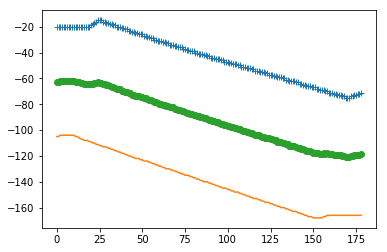

b=60,e=120
[31. 31. 32. 32. 33. 33. 34. 34. 34. 35. 35. 36. 36. 36. 37. 37. 38. 38.
 39. 39. 39. 40. 40. 41. 41. 41. 42. 42. 43. 43. 44. 44. 44. 45. 45. 45.
 46. 46. 47. 47. 47. 48. 48. 49. 49. 49. 50. 50. 51. 51. 51. 52. 52. 52.
 53. 53. 54. 54. 54. 55.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59]
r_x_squared_down0.9985949772689522, r_x_squared_up=0.9979426577587992
data_r_x_down_center=141.0, data_r_x_up_center=44.0


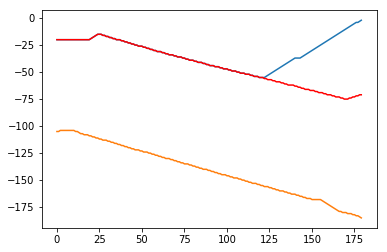

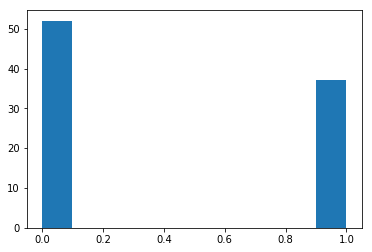

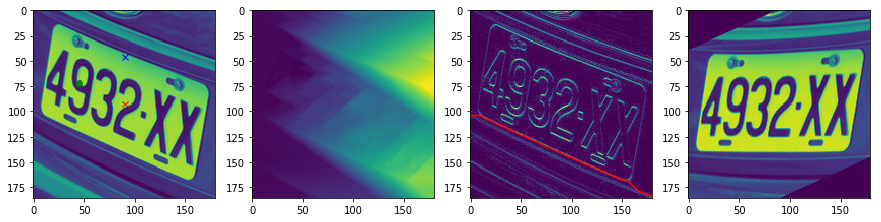

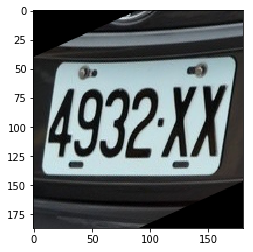

(179, 181)
(179, 181)
row=179, column=181


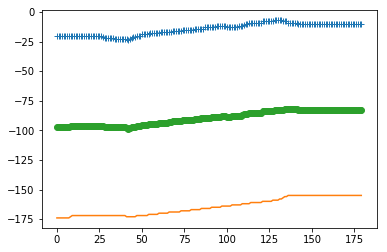

b=60,e=120
[18. 17. 17. 17. 17. 17. 17. 17. 16. 16. 16. 16. 16. 16. 15. 15. 15. 15.
 15. 15. 15. 14. 14. 14. 14. 14. 14. 13. 13. 13. 13. 13. 13. 13. 12. 12.
 12. 12. 12. 12. 13. 13. 13. 13. 13. 13. 13. 12. 12. 12. 11. 10. 10.  9.
  9.  9.  9.  9.  9.  9.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59]
r_x_squared_down0.989575102313944, r_x_squared_up=0.9175801496802746
data_r_x_down_center=166.0, data_r_x_up_center=13.0


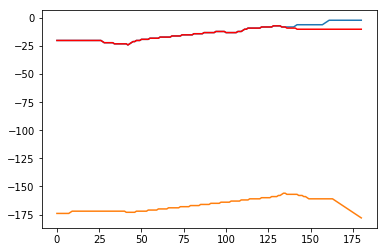

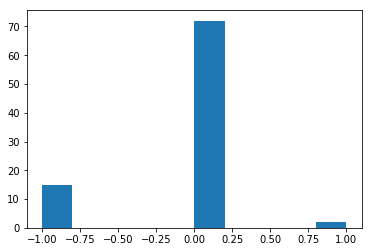

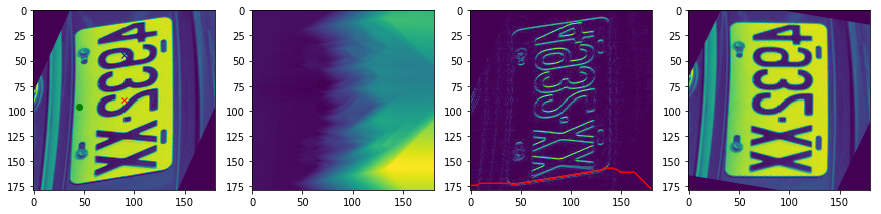

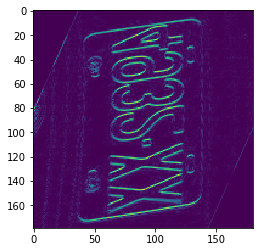

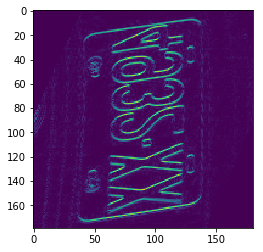

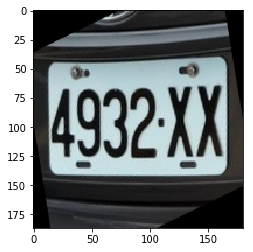

img/0_RAP1829_2.jpg


(59, 58)

14
44
19
38
row=57, column=59


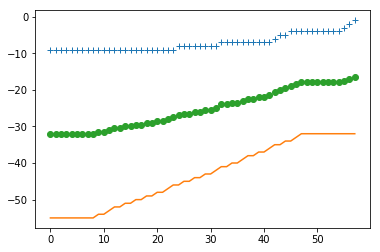

b=19,e=38
[9. 9. 9. 9. 9. 8. 8. 8. 8. 8. 8. 8. 8. 7. 7. 7. 7. 7. 7.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
r_x_squared_down0.9911921872120877, r_x_squared_up=0.8775641025641027
data_r_x_down_center=43.0, data_r_x_up_center=8.0


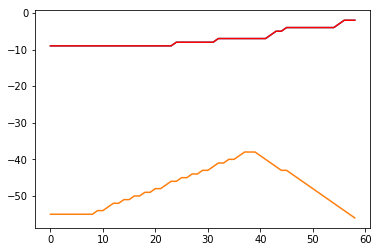

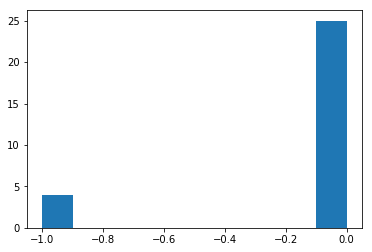

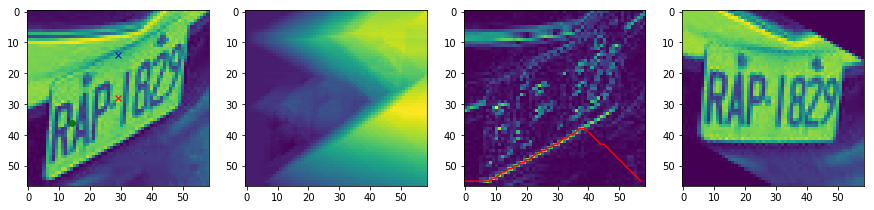

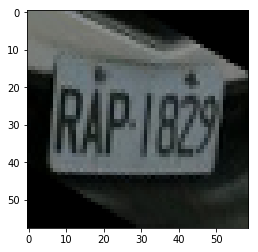

(58, 52)
(58, 52)
row=58, column=52


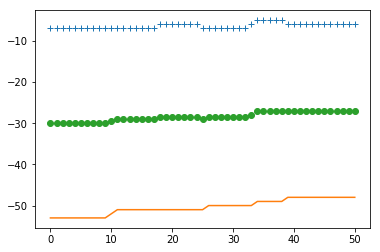

b=17,e=34
[7. 6. 6. 6. 6. 6. 6. 6. 7. 7. 7. 7. 7. 7. 7. 7. 6.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]
r_x_squared_down0.7500000000000014, r_x_squared_up=0.23148148148148173
data_r_x_down_center=50.0, data_r_x_up_center=7.0


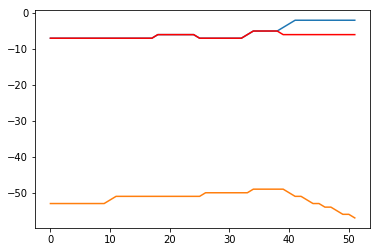

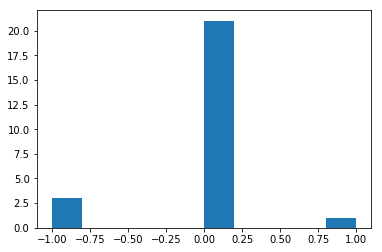

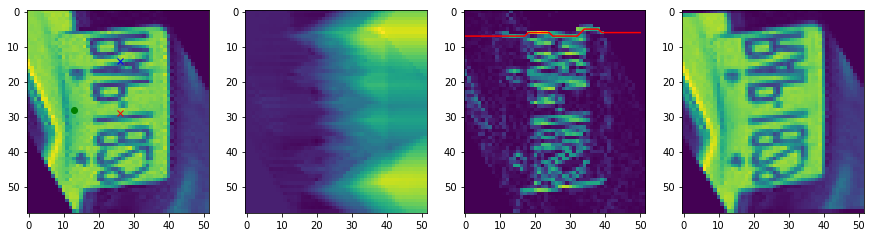

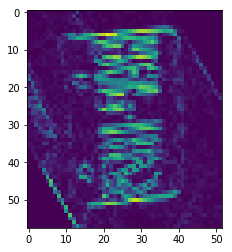

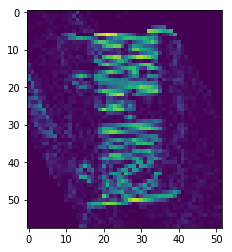

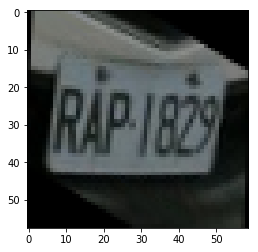

img/aqz3681.jpeg


(96, 125)

24
72
41
83
row=124, column=96


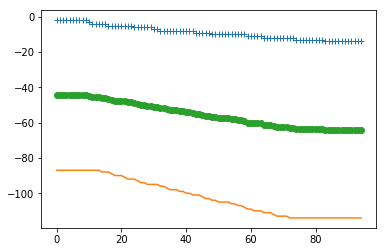

b=32,e=64
[2. 2. 2. 3. 3. 3. 3. 3. 3. 3. 4. 4. 4. 4. 4. 4. 4. 4. 5. 5. 5. 5. 5. 5.
 5. 5. 5. 6. 6. 6. 6. 6.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]
r_x_squared_down0.9921092169402478, r_x_squared_up=0.9416148582600196
data_r_x_down_center=104.0, data_r_x_up_center=4.0


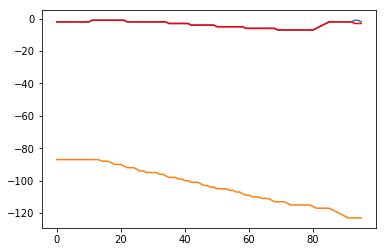

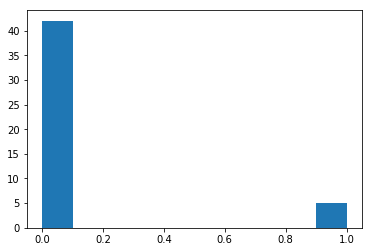

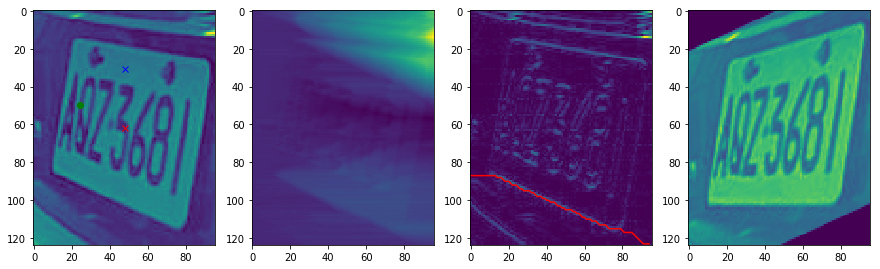

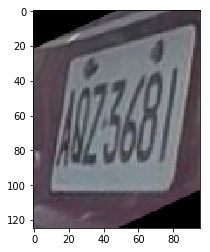

(95, 119)
(95, 119)
row=95, column=119


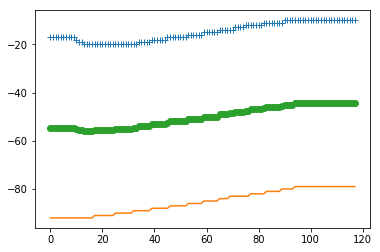

b=39,e=78
[18. 18. 18. 18. 18. 18. 17. 17. 17. 17. 17. 17. 17. 17. 16. 16. 16. 16.
 16. 16. 15. 15. 15. 15. 15. 15. 14. 14. 14. 14. 14. 14. 13. 13. 13. 13.
 12. 12. 12.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]
r_x_squared_down0.9690509357398102, r_x_squared_up=0.9673719567633093
data_r_x_down_center=85.0, data_r_x_up_center=15.0


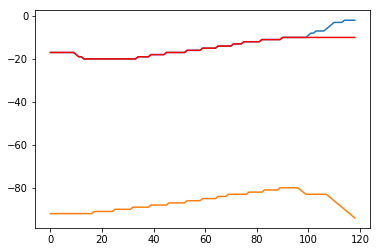

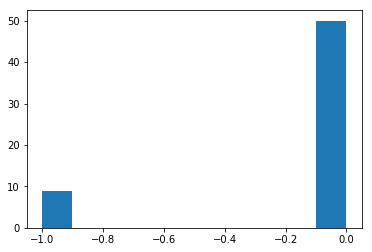

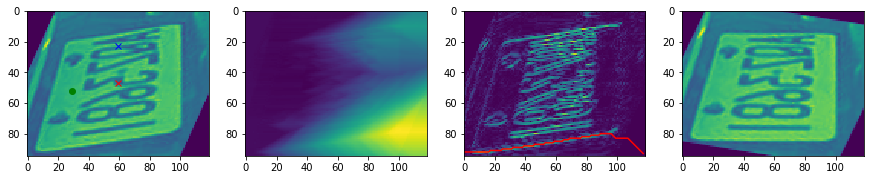

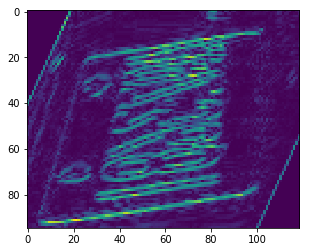

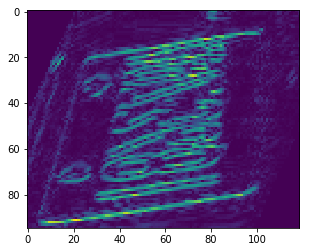

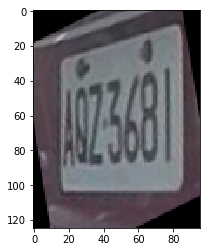

img/0_2326YG_2.jpg


(59, 58)

14
44
19
38
row=57, column=59


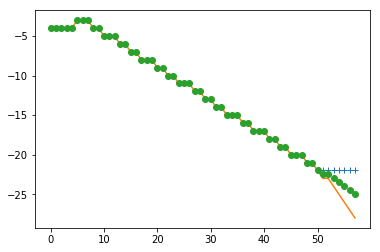

b=19,e=38
[ 8.  9.  9. 10. 10. 11. 11. 11. 12. 12. 13. 13. 14. 14. 15. 15. 15. 16.
 16.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
r_x_squared_down0.9839643652561245, r_x_squared_up=0.9859311424100157
data_r_x_down_center=42.0, data_r_x_up_center=13.0


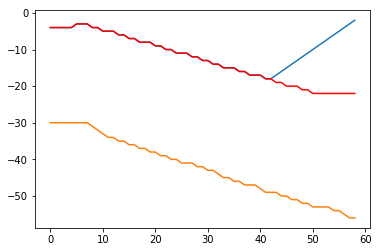

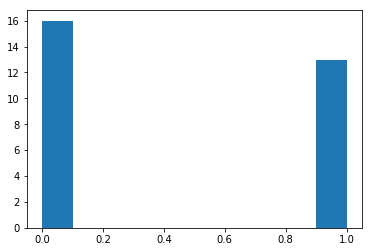

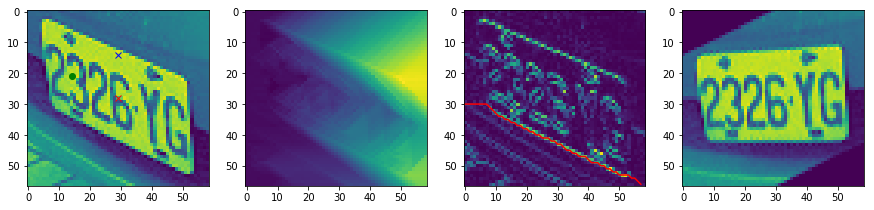

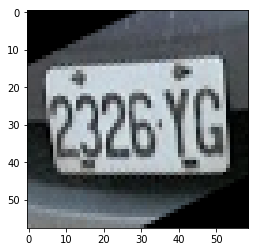

(58, 52)
(58, 52)
row=58, column=52


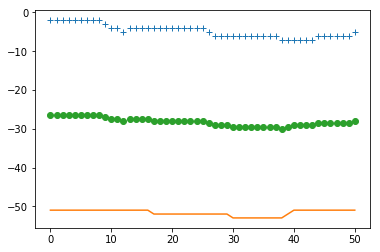

b=17,e=34
[4. 4. 4. 4. 4. 4. 4. 4. 4. 5. 6. 6. 6. 6. 6. 6. 6.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]
r_x_squared_down0.5416666666666652, r_x_squared_up=0.7837375621890545
data_r_x_down_center=52.0, data_r_x_up_center=5.0


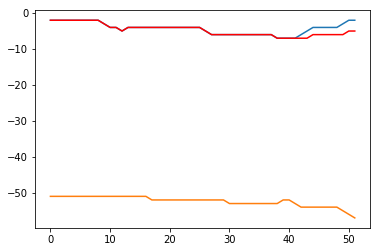

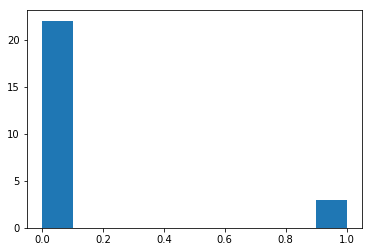

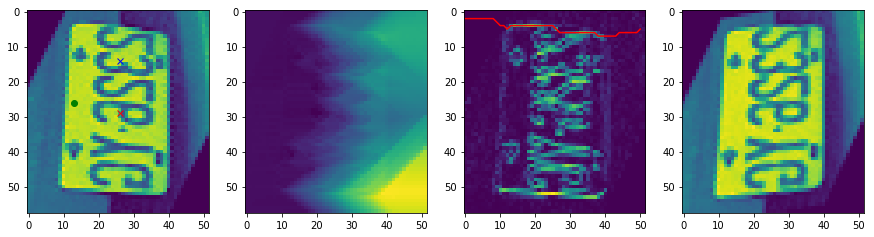

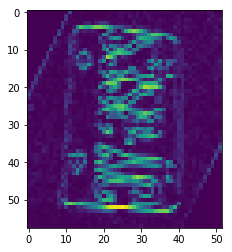

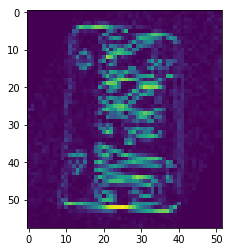

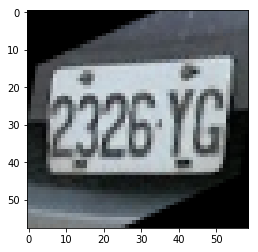

img/0_AFL3797_1.jpg


(209, 165)

52
156
55
110
row=164, column=209


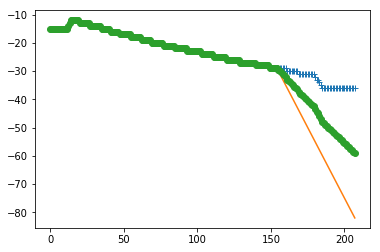

b=69,e=138
[20. 20. 20. 20. 20. 20. 20. 20. 21. 21. 21. 21. 21. 21. 21. 21. 22. 22.
 22. 22. 22. 22. 22. 22. 23. 23. 23. 23. 23. 23. 23. 23. 23. 23. 24. 24.
 24. 24. 24. 24. 24. 24. 25. 25. 25. 25. 25. 25. 25. 25. 25. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 27. 27. 27. 27. 27. 27. 27. 27. 27.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68]
r_x_squared_down0.9948075990420621, r_x_squared_up=0.9838777237162746
data_r_x_down_center=137.0, data_r_x_up_center=24.0


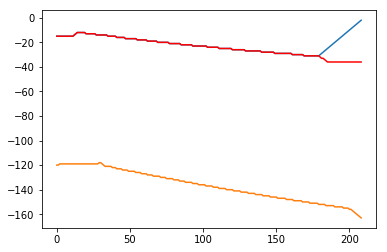

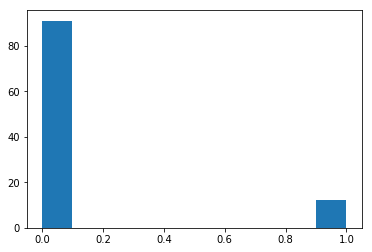

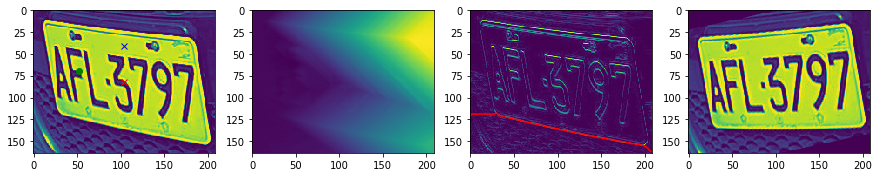

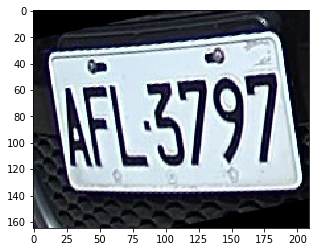

(208, 159)
(208, 159)
row=208, column=159


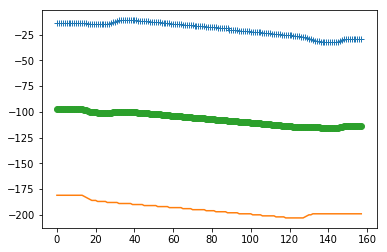

b=52,e=105
[13. 13. 14. 14. 14. 14. 14. 15. 15. 15. 15. 15. 15. 16. 16. 16. 16. 16.
 16. 17. 17. 17. 17. 17. 17. 18. 18. 18. 18. 18. 18. 19. 19. 19. 19. 19.
 19. 20. 20. 20. 20. 20. 21. 21. 21. 21. 21. 21. 22. 22. 22. 22. 22.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52]
r_x_squared_down0.9867283295854724, r_x_squared_up=0.9880635930793465
data_r_x_down_center=196.0, data_r_x_up_center=18.0


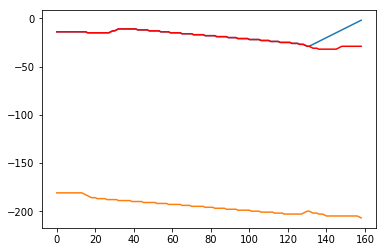

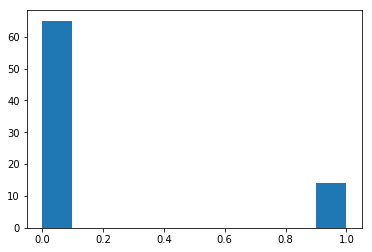

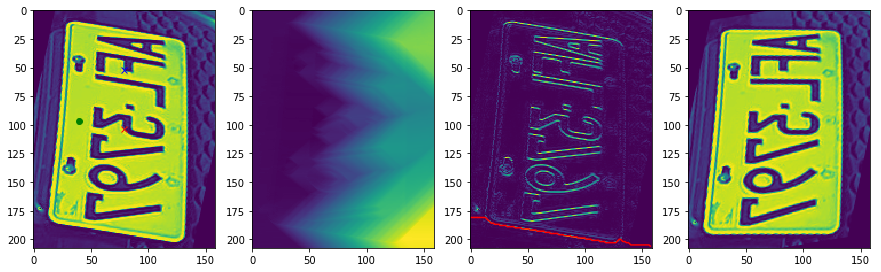

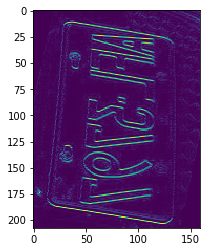

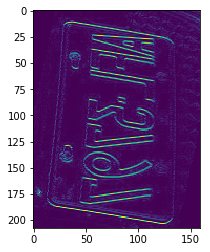

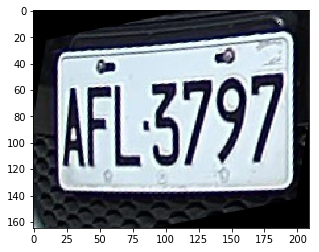

img/0_5790PD_1.jpg


(63, 69)

15
47
23
46
row=68, column=63


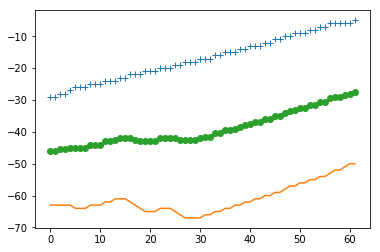

b=20,e=41
[21. 21. 20. 20. 20. 19. 19. 18. 18. 18. 17. 17. 17. 16. 16. 15. 15. 15.
 14. 14. 13.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]
r_x_squared_down0.9865403494993126, r_x_squared_up=0.9851351351351352
data_r_x_down_center=54.0, data_r_x_up_center=17.0


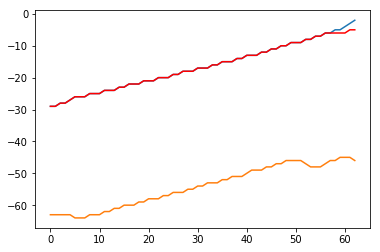

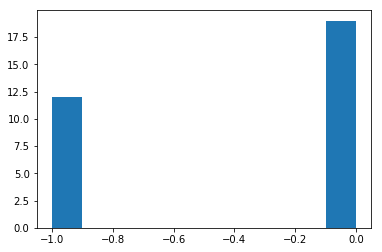

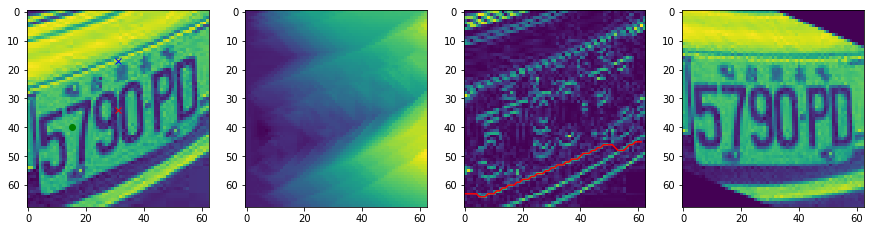

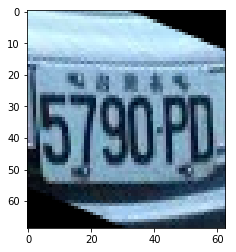

(62, 63)
(62, 63)
row=62, column=63


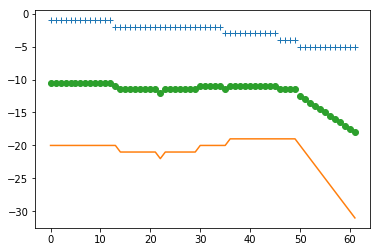

b=20,e=41
[21. 21. 22. 21. 21. 21. 21. 21. 21. 21. 20. 20. 20. 20. 20. 20. 19. 19.
 19. 19. 19.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]
r_x_squared_down0.6122629169391753, r_x_squared_up=0.8460127591706539
data_r_x_down_center=58.0, data_r_x_up_center=20.0


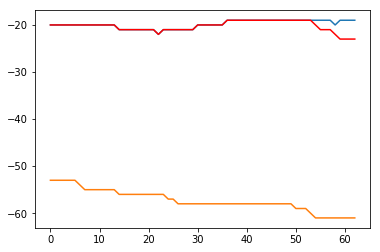

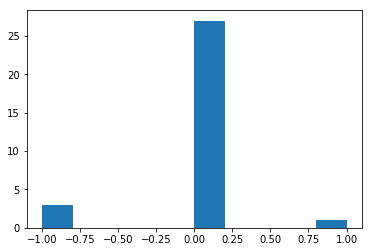

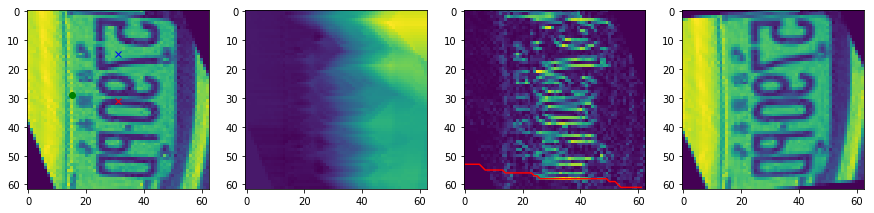

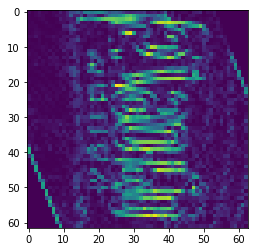

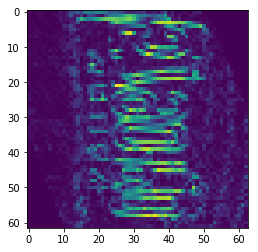

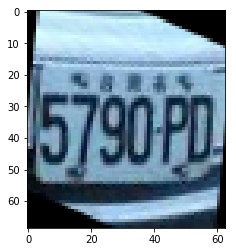

img/5876j9.jpeg


(112, 109)

28
84
36
72
row=108, column=112


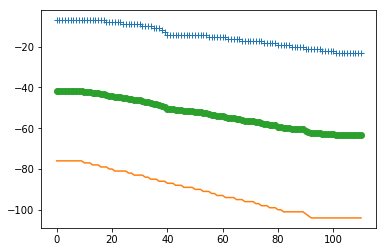

b=37,e=74
[11. 12. 13. 14. 14. 14. 14. 14. 14. 14. 14. 14. 14. 14. 14. 14. 14. 14.
 15. 15. 15. 15. 15. 15. 15. 16. 16. 16. 16. 16. 17. 17. 17. 17. 17. 17.
 17.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
r_x_squared_down0.991693773106453, r_x_squared_up=0.8725336712887034
data_r_x_down_center=92.0, data_r_x_up_center=15.0


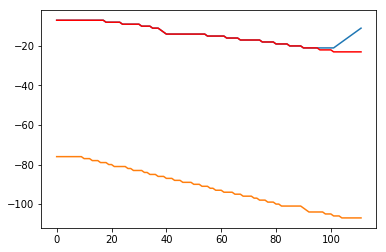

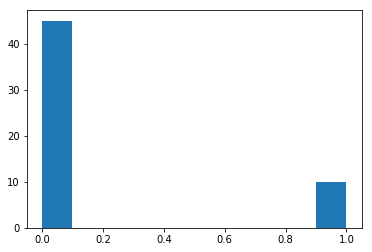

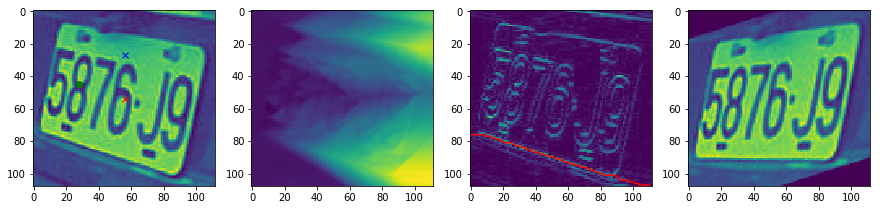

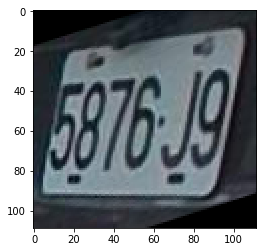

(111, 103)
(111, 103)
row=111, column=103


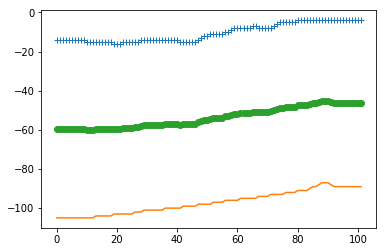

b=34,e=68
[14. 14. 14. 14. 14. 14. 14. 15. 15. 15. 15. 15. 15. 14. 13. 12. 12. 11.
 11. 11. 11. 11. 10. 10.  9.  8.  8.  8.  8.  8.  8.  7.  7.  8.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33]
r_x_squared_down0.9770507546507549, r_x_squared_up=0.8618120560049585
data_r_x_down_center=98.0, data_r_x_up_center=11.0


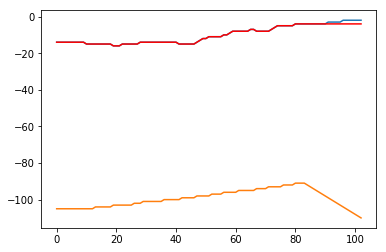

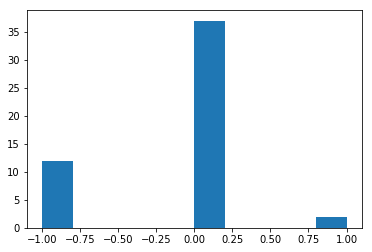

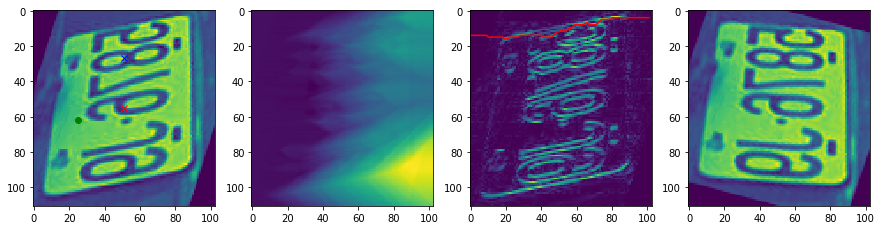

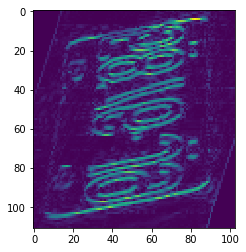

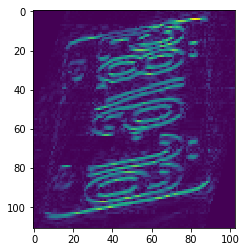

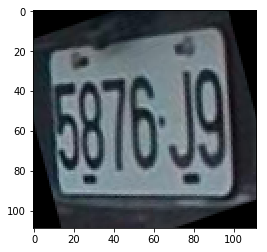

img/bbh1001.jpeg


(93, 118)

23
69
39
78
row=117, column=93


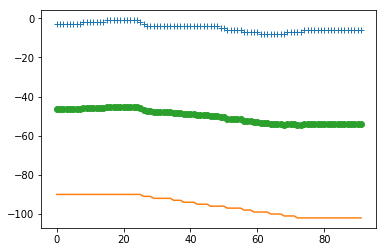

b=30,e=61
[4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 5. 5. 6. 6. 6.
 6. 6. 7. 7. 7. 7. 7.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]
r_x_squared_down1.0, r_x_squared_up=0.7479228486646884
data_r_x_down_center=111.0, data_r_x_up_center=4.0


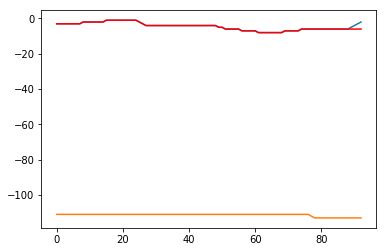

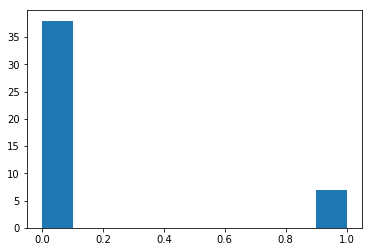

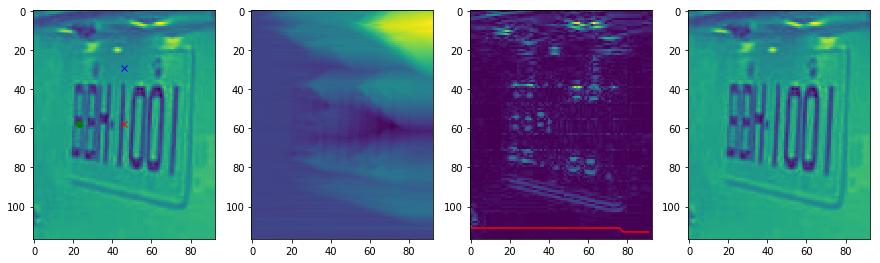

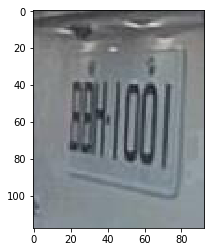

(92, 112)
(92, 112)
row=92, column=112


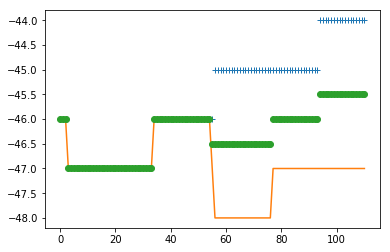

b=37,e=74
[20. 20. 20. 20. 20. 20. 20. 20. 20. 20. 20. 20. 20. 20. 20. 20. 20. 20.
 20. 20. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 18.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
r_x_squared_down0.7499999999999996, r_x_squared_up=0.7456140350877196
data_r_x_down_center=72.0, data_r_x_up_center=20.0


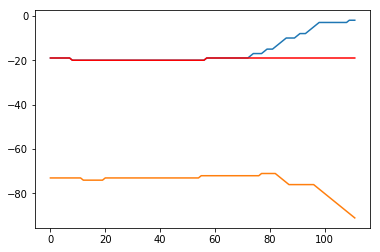

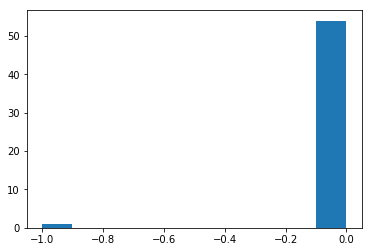

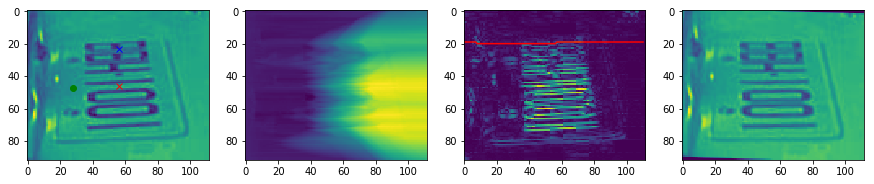

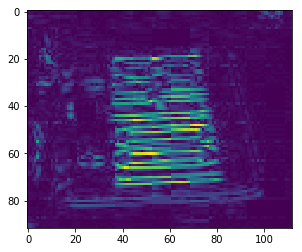

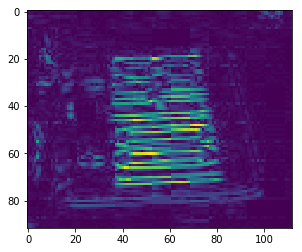

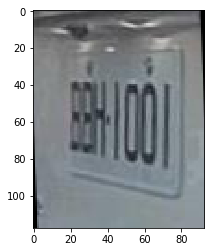

img/0_RCK3967_3.jpg


(66, 49)

16
49
16
32
row=48, column=66


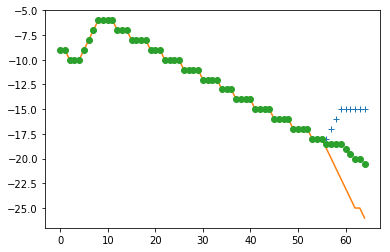

b=22,e=44
[10. 10. 10. 10. 11. 11. 11. 11. 12. 12. 12. 12. 13. 13. 13. 14. 14. 14.
 14. 15. 15. 15.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]
r_x_squared_down0.9798610211060487, r_x_squared_up=0.9717543451411388
data_r_x_down_center=37.0, data_r_x_up_center=12.0


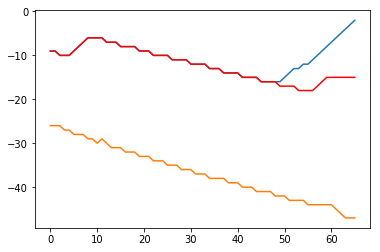

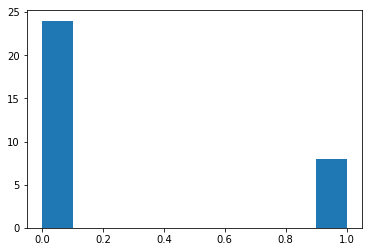

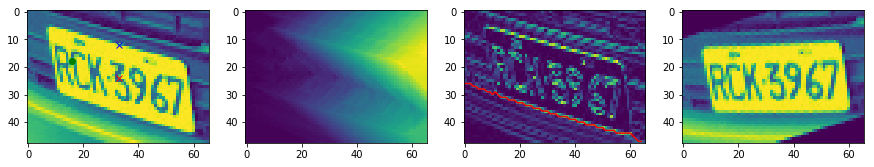

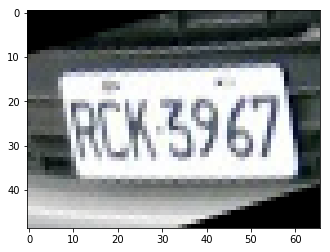

(65, 43)
(65, 43)
row=65, column=43


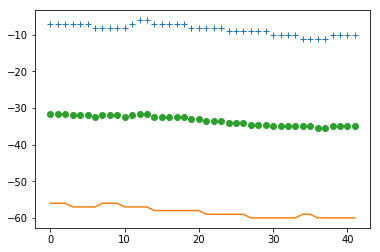

b=14,e=28
[7. 7. 7. 7. 7. 8. 8. 8. 8. 8. 9. 9. 9. 9.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
r_x_squared_down0.7781376518218631, r_x_squared_up=0.8892307692307693
data_r_x_down_center=59.0, data_r_x_up_center=8.0


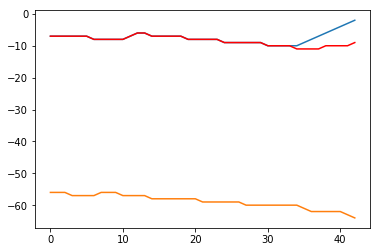

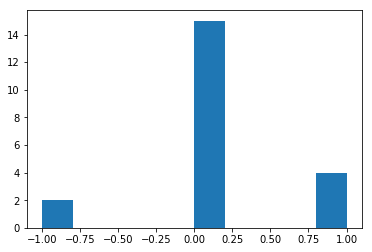

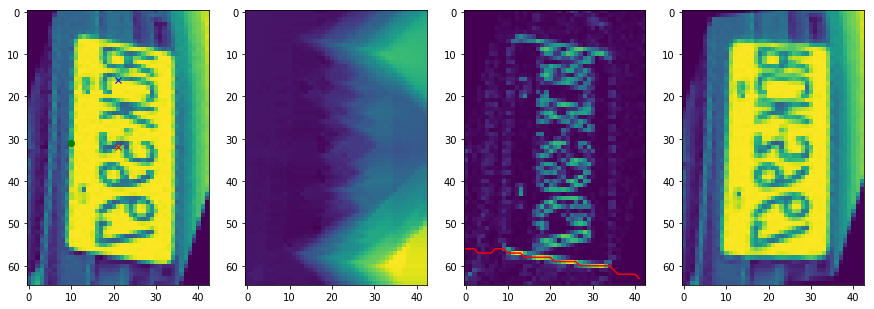

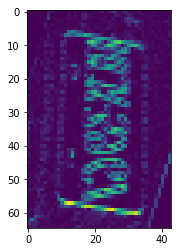

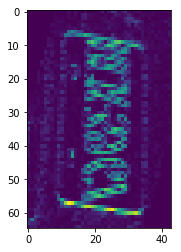

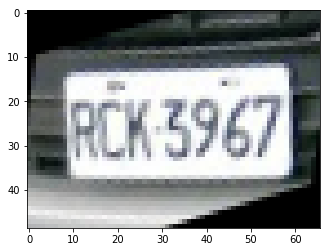

img/0_6603A9_1.jpg


(135, 73)

33
101
24
48
row=72, column=135


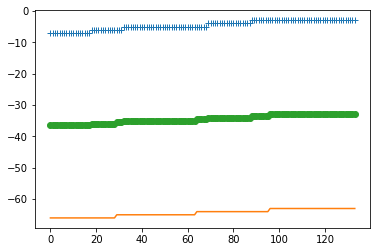

b=44,e=89
[5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.
 5. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 3.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
r_x_squared_down0.7411067193675887, r_x_squared_up=0.7384517107837266
data_r_x_down_center=64.0, data_r_x_up_center=5.0


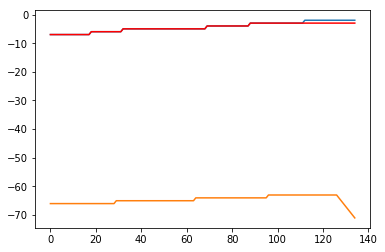

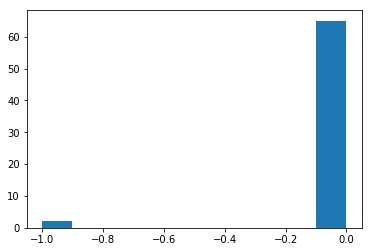

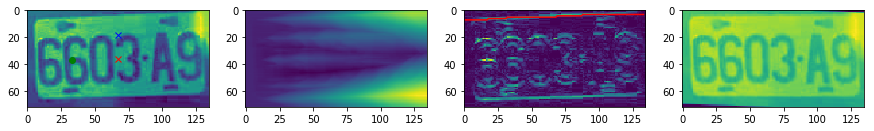

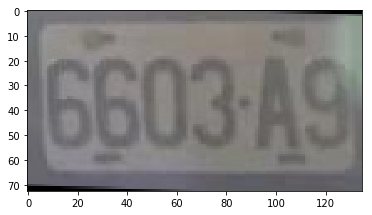

(134, 67)
(134, 67)
row=134, column=67


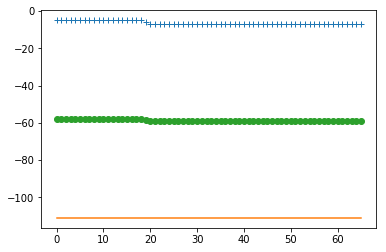

b=22,e=44
[5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]
r_x_squared_down1.0, r_x_squared_up=1.0
data_r_x_down_center=130.0, data_r_x_up_center=5.0


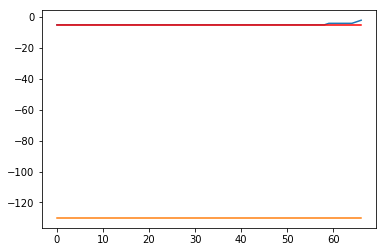

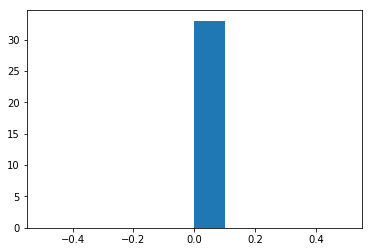

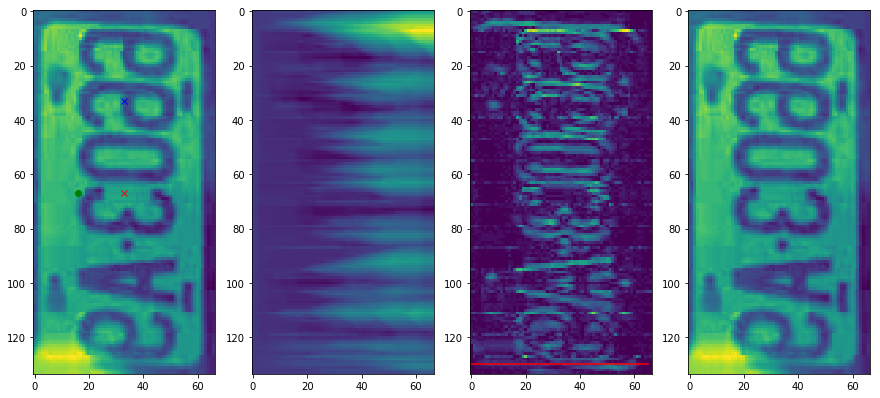

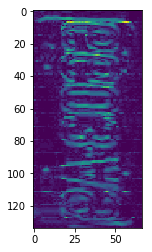

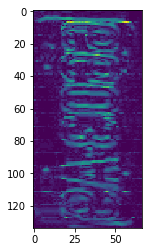

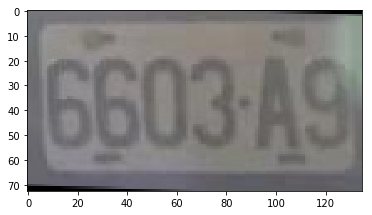

img/0_1111E2_1.jpg


(147, 117)

36
110
39
78
row=116, column=147


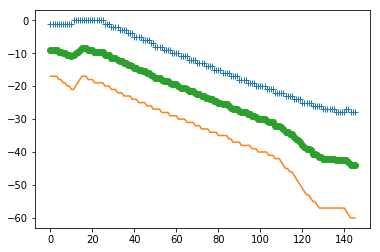

b=48,e=97
[ 7.  7.  8.  8.  8.  8.  9.  9.  9.  9. 10. 10. 10. 10. 11. 11. 11. 11.
 12. 12. 12. 12. 13. 13. 13. 13. 14. 14. 14. 14. 15. 15. 15. 15. 16. 16.
 16. 16. 17. 17. 17. 17. 18. 18. 18. 18. 19. 19. 19.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48]
r_x_squared_down0.9937327316061262, r_x_squared_up=0.9939256525177961
data_r_x_down_center=95.0, data_r_x_up_center=13.0


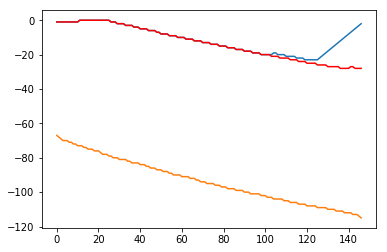

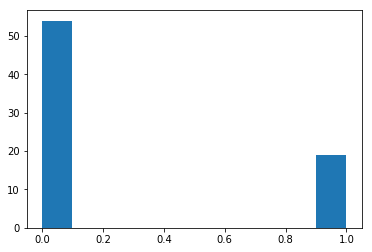

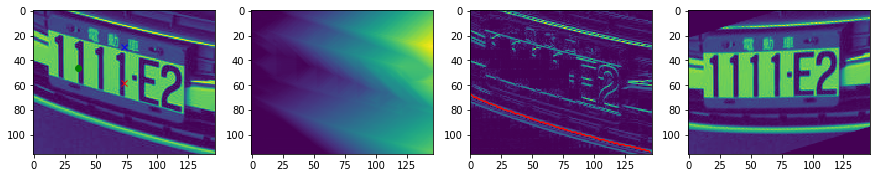

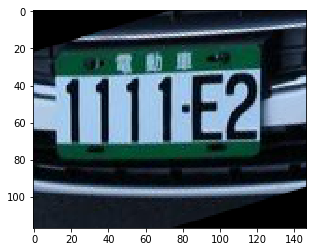

(146, 111)
(146, 111)
row=146, column=111


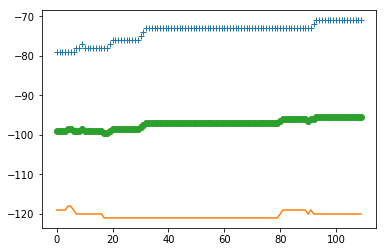

b=36,e=73
[23. 23. 23. 23. 23. 23. 23. 23. 23. 23. 23. 23. 23. 23. 23. 23. 23. 23.
 23. 23. 23. 23. 23. 23. 24. 24. 24. 24. 24. 24. 24. 24. 23. 23. 23. 22.
 21.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
r_x_squared_down1.0, r_x_squared_up=0.6842105263157894
data_r_x_down_center=121.0, data_r_x_up_center=23.0


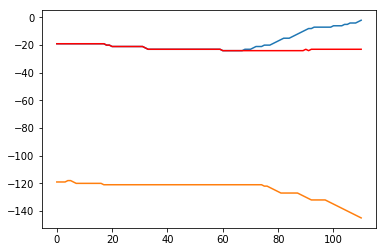

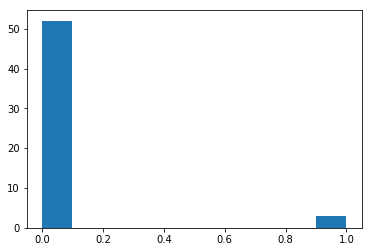

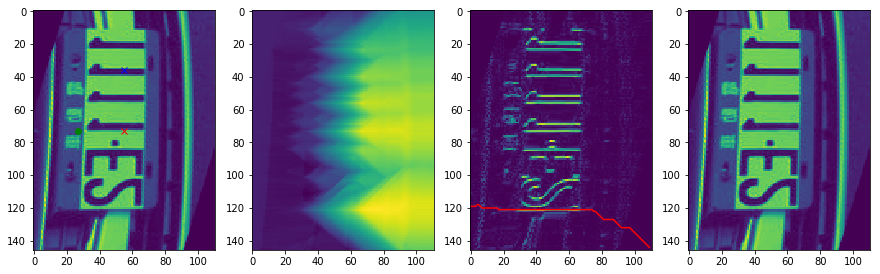

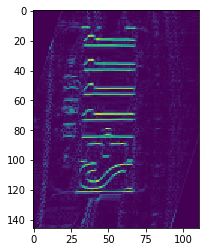

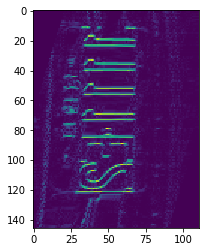

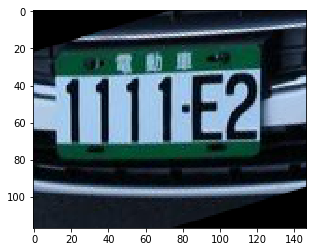

img/6992mj.jpeg


(61, 93)

15
45
31
62
row=92, column=61


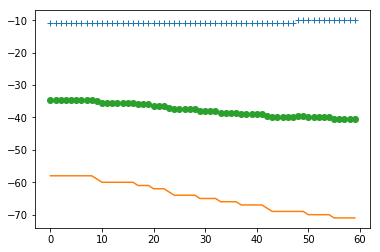

b=20,e=40
[5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
r_x_squared_down1.0, r_x_squared_up=1.0
data_r_x_down_center=88.0, data_r_x_up_center=5.0


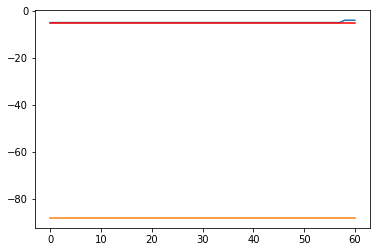

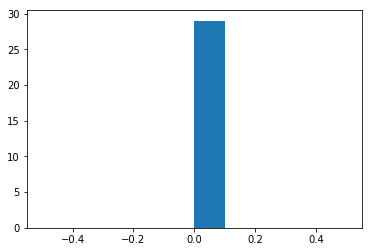

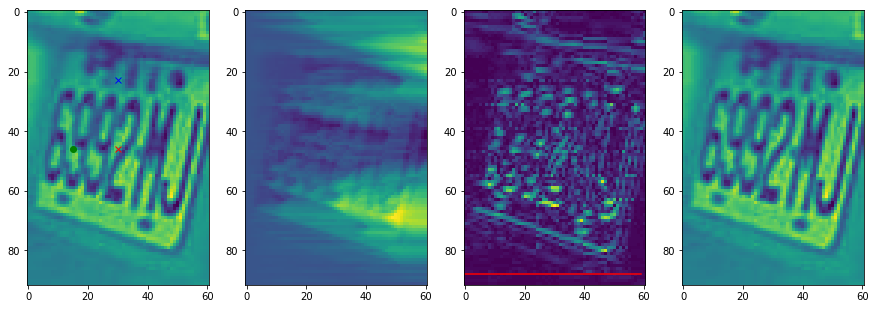

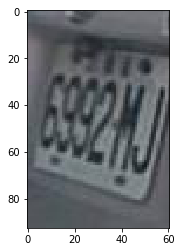

(60, 87)
(60, 87)
row=60, column=87


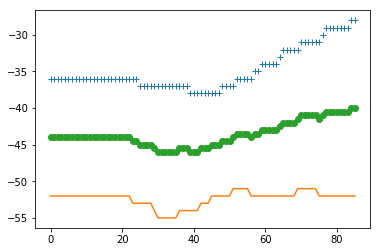

b=28,e=57
[7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 6. 6. 6. 5. 5. 5. 5. 5. 5. 5.
 5. 5. 5. 4. 3.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]
r_x_squared_down0.7919717350587434, r_x_squared_up=0.8196162046908316
data_r_x_down_center=53.0, data_r_x_up_center=6.0


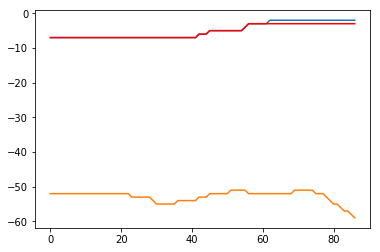

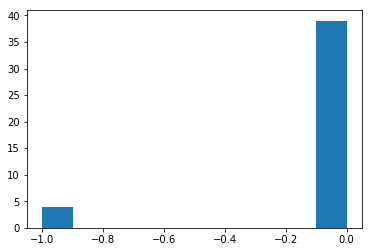

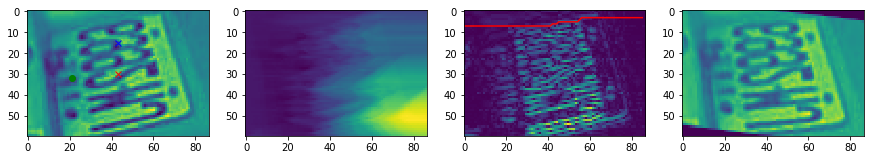

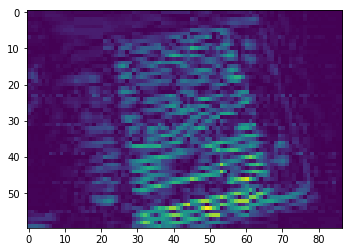

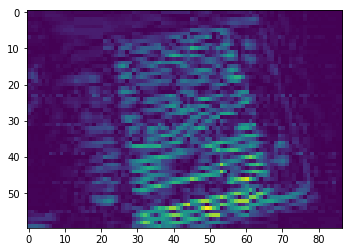

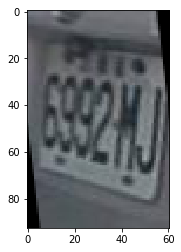

img/0_5478C7_1.jpg


(107, 83)

26
80
27
55
row=82, column=107


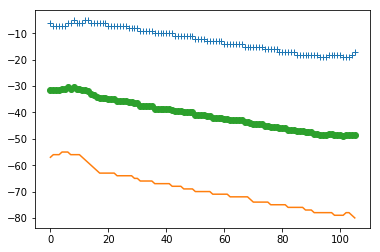

b=35,e=70
[ 9. 10. 10. 10. 10. 10. 10. 10. 11. 11. 11. 11. 11. 11. 11. 12. 12. 12.
 12. 13. 13. 13. 13. 13. 13. 14. 14. 14. 14. 14. 14. 14. 13. 12. 11.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34]
r_x_squared_down0.9677664184332752, r_x_squared_up=0.96696212731668
data_r_x_down_center=70.0, data_r_x_up_center=12.0


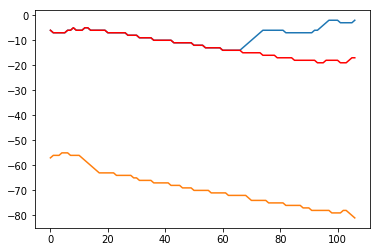

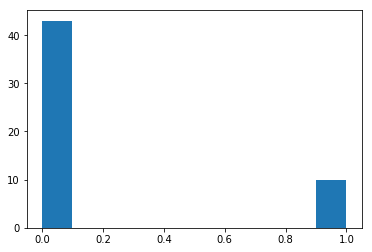

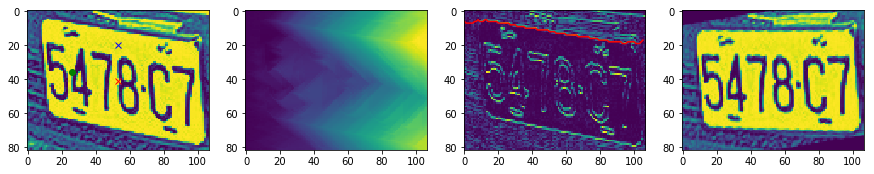

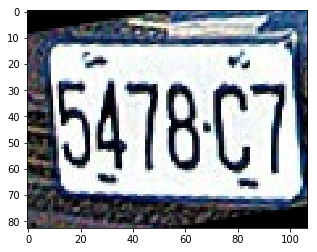

(106, 77)
(106, 77)
row=106, column=77


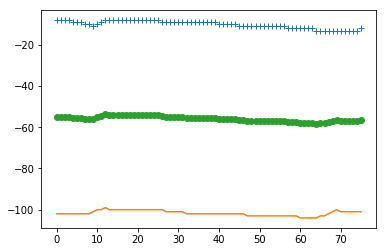

b=25,e=50
[ 8.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9. 10. 10. 10.
 10. 10. 11. 11. 11. 11. 11.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24]
r_x_squared_down0.7481508875739621, r_x_squared_up=0.7950271094544222
data_r_x_down_center=102.0, data_r_x_up_center=9.0


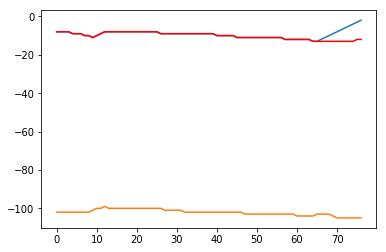

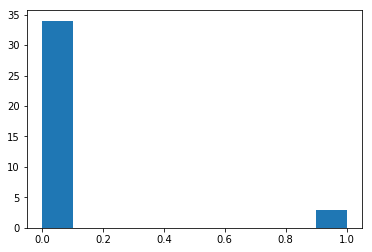

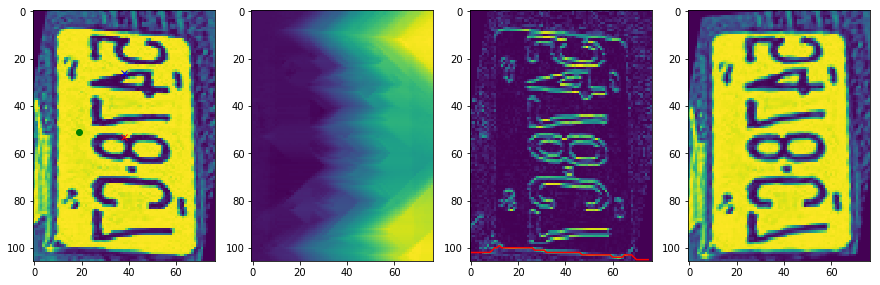

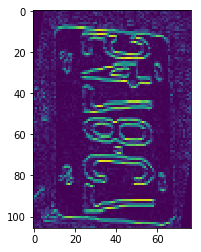

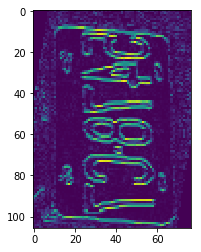

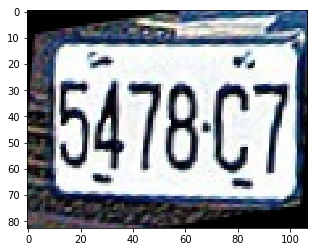

img/0_AQP8598_1.jpg


(173, 86)

43
129
28
57
row=85, column=173


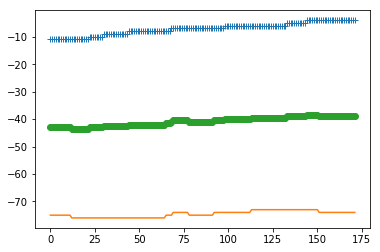

b=57,e=114
[8. 8. 8. 8. 8. 8. 8. 8. 8. 8. 8. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56]
r_x_squared_down0.5100899868311959, r_x_squared_up=0.823742768642099
data_r_x_down_center=75.0, data_r_x_up_center=7.0


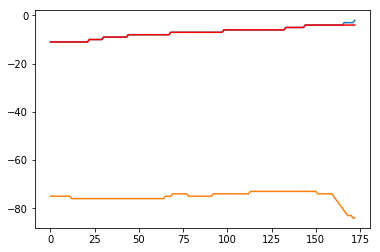

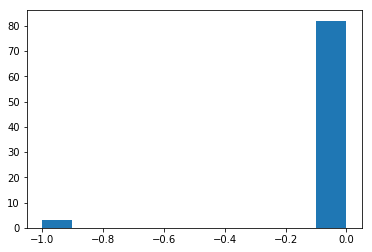

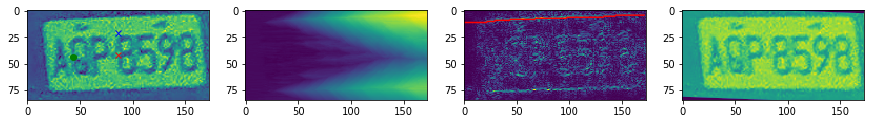

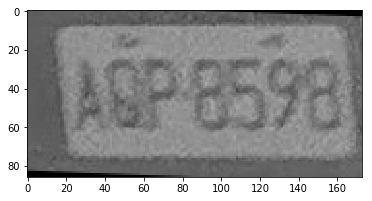

(172, 80)
(172, 80)
row=172, column=80


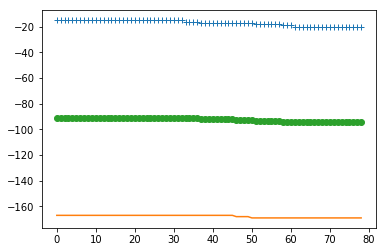

b=26,e=53
[4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]
r_x_squared_down0.5578578048457532, r_x_squared_up=1.0
data_r_x_down_center=167.0, data_r_x_up_center=4.0


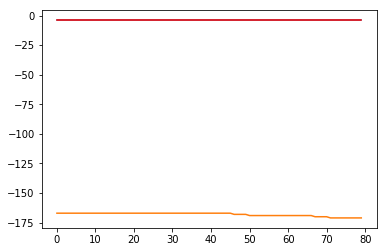

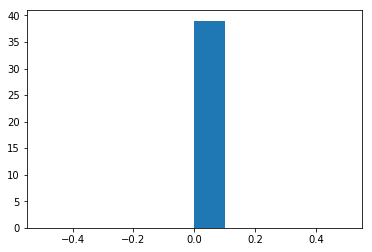

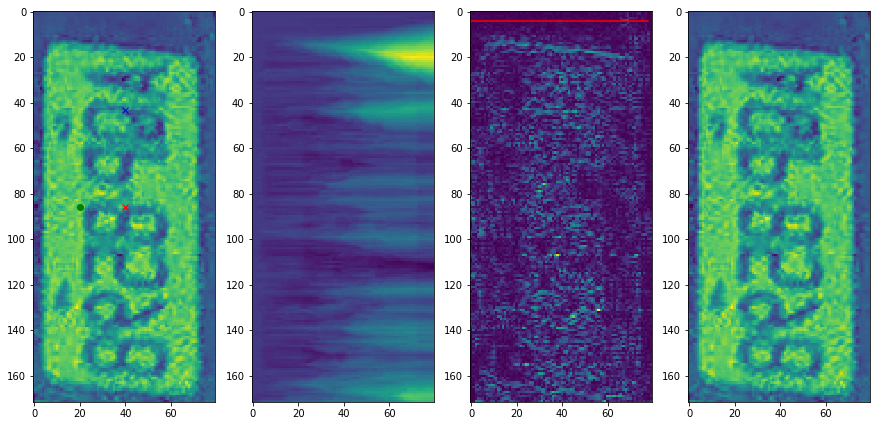

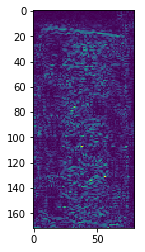

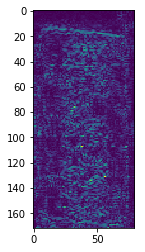

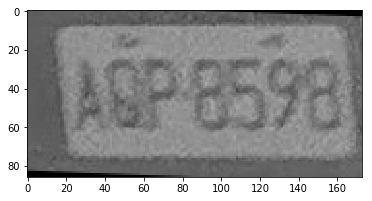

img/0_5180S5_1.jpg


(81, 62)

20
60
20
41
row=61, column=81


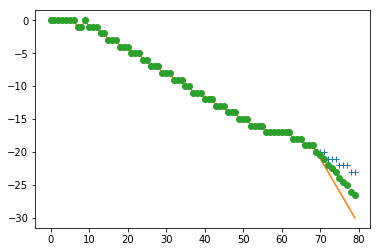

b=26,e=53
[ 7.  7.  7.  8.  8.  8.  9.  9.  9. 10. 10. 11. 11. 11. 12. 12. 12. 13.
 13. 13. 14. 14. 14. 15. 15. 15. 16.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]
r_x_squared_down0.9917689314576476, r_x_squared_up=0.9890381000578369
data_r_x_down_center=45.0, data_r_x_up_center=12.0


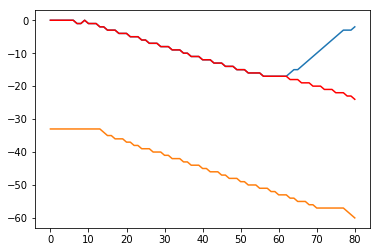

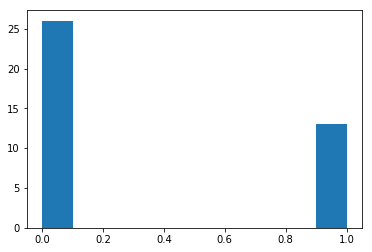

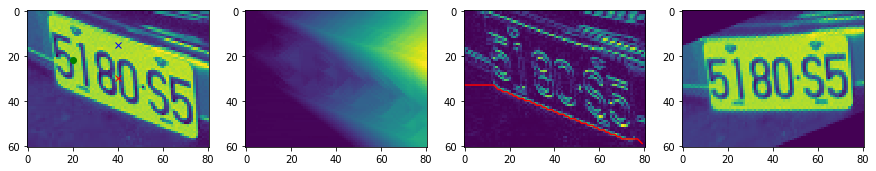

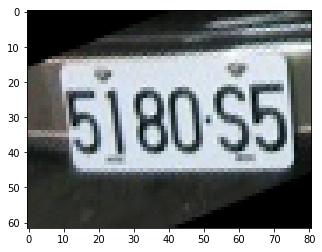

(80, 56)
(80, 56)
row=80, column=56


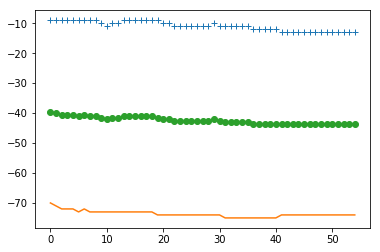

b=18,e=37
[ 9.  9. 10. 10. 11. 11. 11. 11. 11. 11. 11. 10. 11. 11. 11. 11. 11. 11.
 12.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
r_x_squared_down0.7111111111111084, r_x_squared_up=0.5062500000000001
data_r_x_down_center=74.0, data_r_x_up_center=11.0


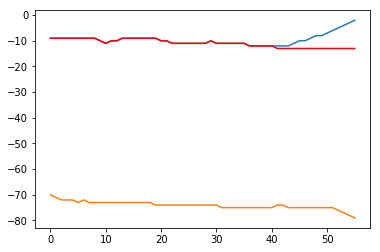

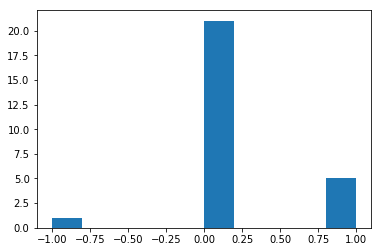

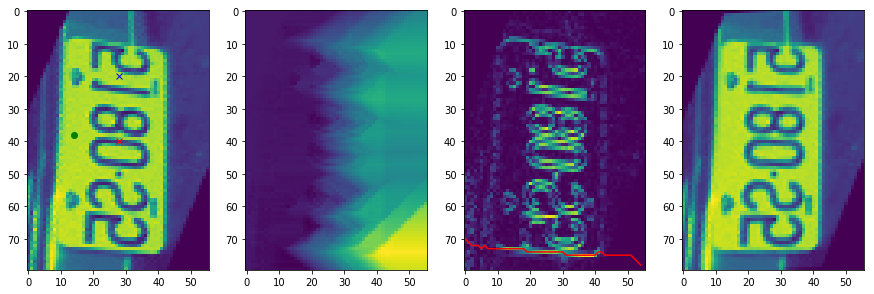

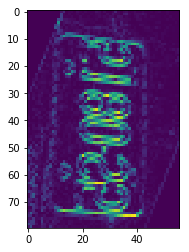

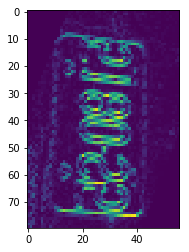

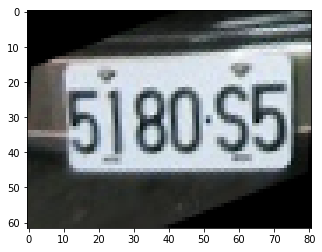

img/0_3903ES_3.jpg


(143, 90)

35
107
30
60
row=89, column=143


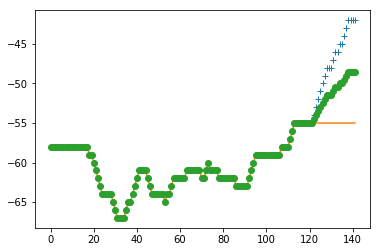

b=47,e=94
[16. 16. 16. 15. 15. 15. 15. 15. 15. 14. 14. 14. 14. 14. 14. 14. 14. 14.
 14. 14. 14. 14. 14. 14. 14. 13. 13. 12. 12. 12. 12. 12. 12. 11. 11. 11.
 11. 11. 11. 11. 11. 11. 11. 11. 11. 11. 10.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46]
r_x_squared_down0.8673228552619767, r_x_squared_up=0.9267763639629183
data_r_x_down_center=67.0, data_r_x_up_center=14.0


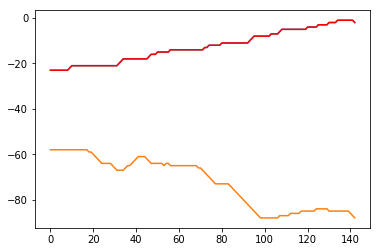

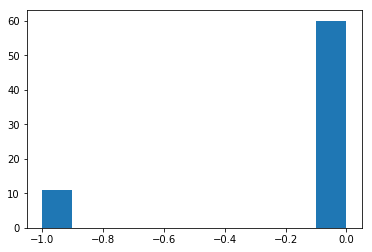

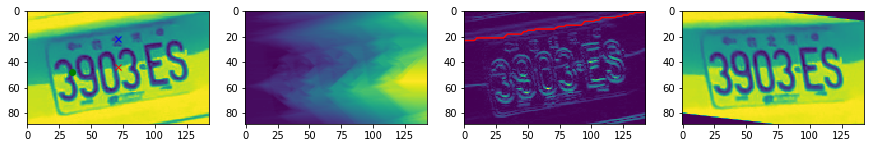

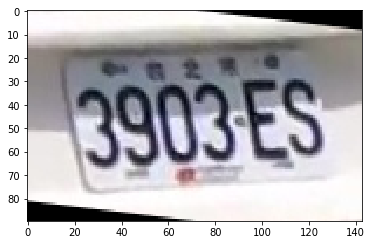

(142, 84)
(142, 84)
row=142, column=84


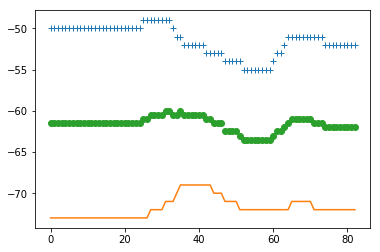

b=28,e=56
[16. 16. 16. 16. 17. 17. 17. 17. 18. 18. 18. 18. 18. 18. 19. 19. 19. 19.
 20. 20. 20. 20. 20. 21. 21. 21. 22. 22.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]
r_x_squared_down0.9065134099616862, r_x_squared_up=0.9694731838731184
data_r_x_down_center=123.0, data_r_x_up_center=19.0


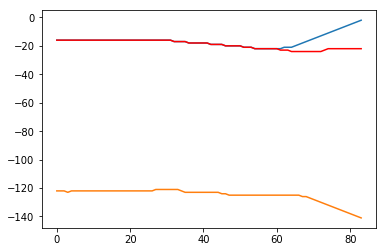

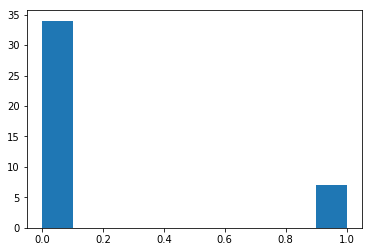

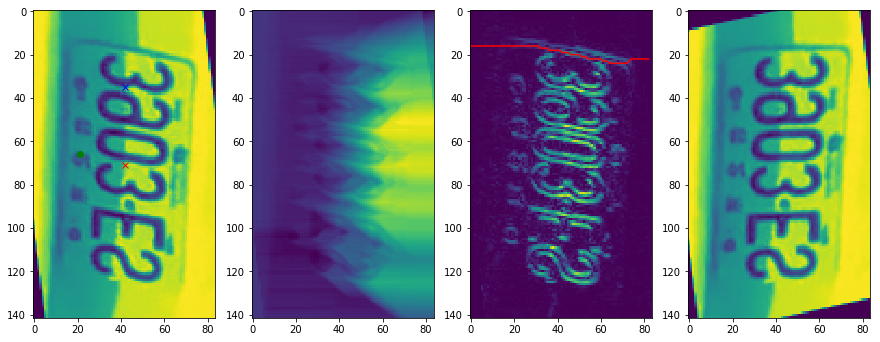

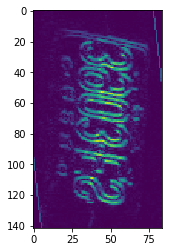

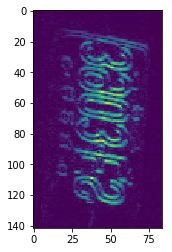

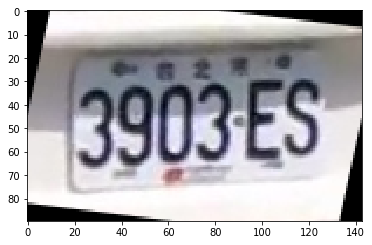

img/0_5168U9_1.jpg


(70, 60)

17
52
20
40
row=59, column=70


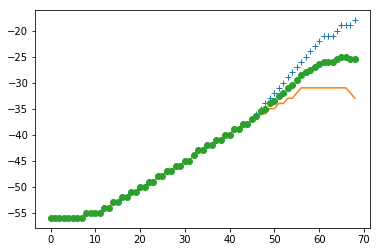

b=23,e=46
[ 7.  7.  6.  6.  6.  5.  5.  4.  4.  3.  3.  3.  4.  5.  6.  7.  8.  8.
  9.  9. 10. 10. 10.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]
r_x_squared_down0.9939989403901537, r_x_squared_up=0.33820346320346323
data_r_x_down_center=42.0, data_r_x_up_center=4.0


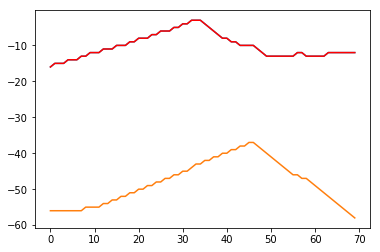

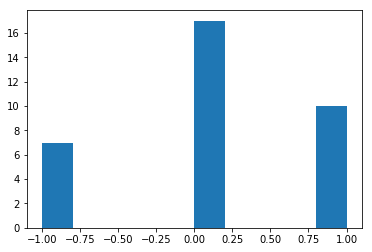

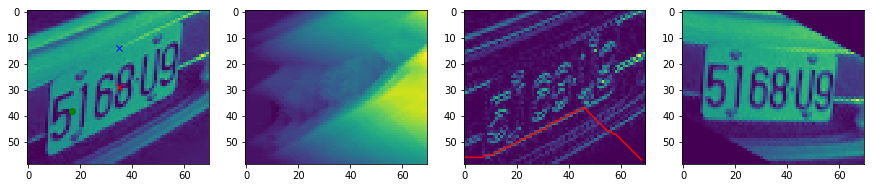

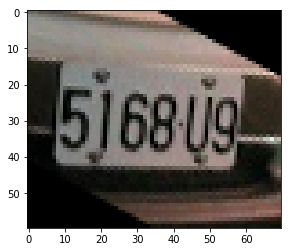

(69, 54)
(69, 54)
row=69, column=54


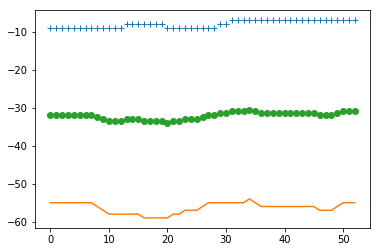

b=18,e=36
[8. 8. 9. 9. 9. 9. 9. 9. 9. 9. 9. 8. 8. 7. 7. 7. 7. 7.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]
r_x_squared_down0.8792999656002752, r_x_squared_up=0.47620297003725665
data_r_x_down_center=55.0, data_r_x_up_center=9.0


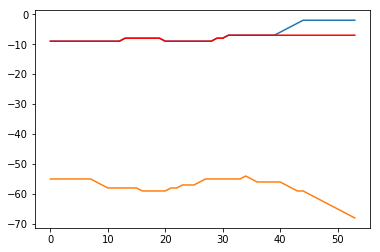

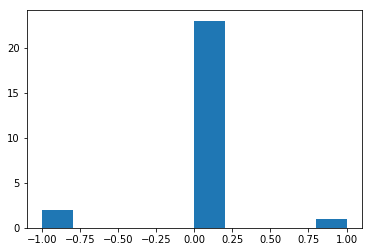

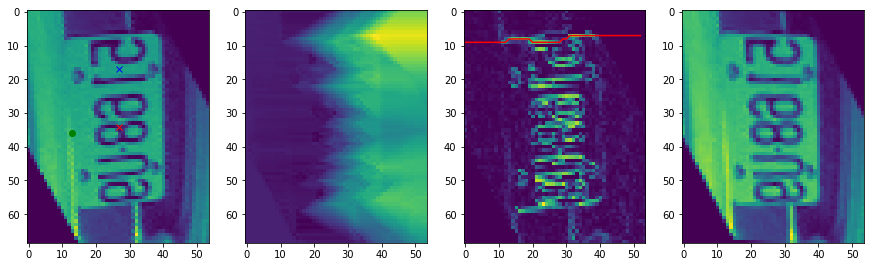

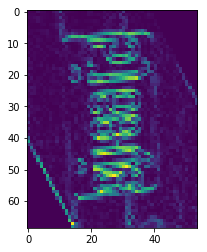

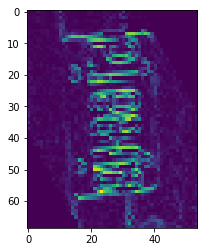

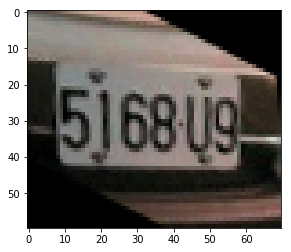

img/bey2986.jpeg


(122, 93)

30
91
31
62
row=92, column=122


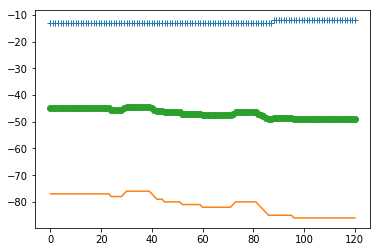

b=40,e=81
[13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13.
 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13.
 13. 13. 13. 13. 13.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40]
r_x_squared_down0.19923081563706602, r_x_squared_up=1.0
data_r_x_down_center=82.0, data_r_x_up_center=13.0


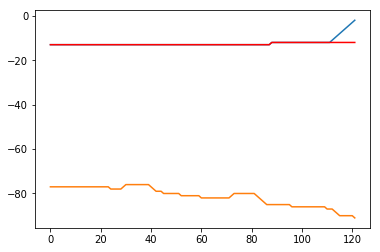

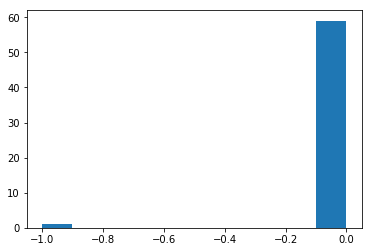

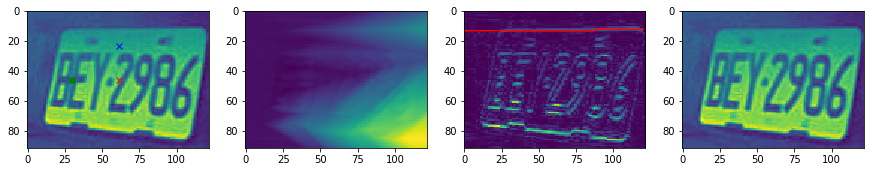

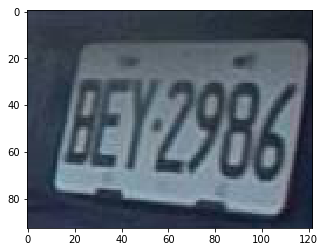

(121, 87)
(121, 87)
row=121, column=87


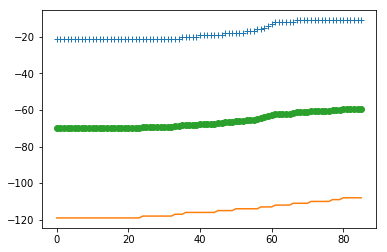

b=28,e=57
[21. 21. 21. 21. 21. 21. 21. 20. 20. 20. 20. 20. 19. 19. 19. 19. 19. 19.
 19. 18. 18. 18. 18. 18. 18. 17. 17. 17. 16.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]
r_x_squared_down0.9385480388629, r_x_squared_up=0.9466688763672523
data_r_x_down_center=116.0, data_r_x_up_center=19.0


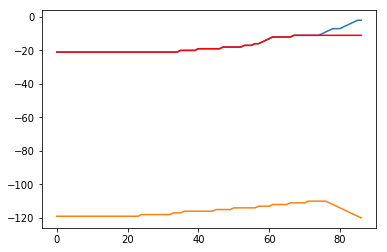

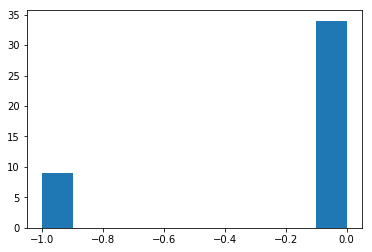

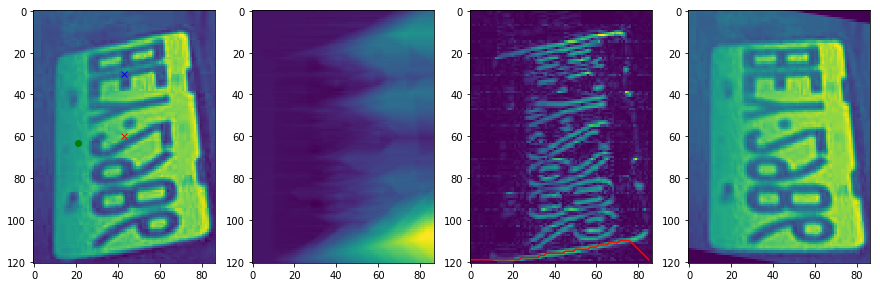

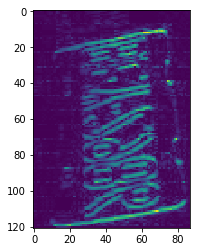

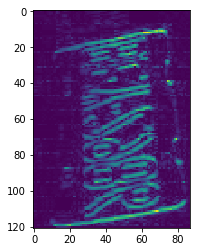

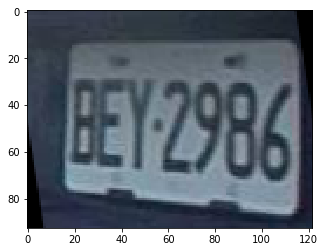

img/0_3903ES_2.jpg


(172, 119)

43
129
39
79
row=118, column=172


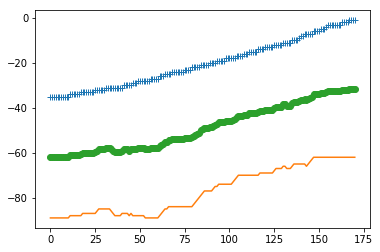

b=57,e=114
[27. 27. 27. 27. 26. 26. 26. 25. 25. 25. 25. 24. 24. 24. 24. 24. 24. 24.
 23. 23. 23. 23. 22. 22. 22. 22. 22. 21. 21. 21. 21. 21. 20. 20. 20. 20.
 19. 19. 19. 19. 19. 18. 18. 18. 18. 18. 18. 17. 17. 17. 17. 16. 16. 16.
 15. 15. 15.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56]
r_x_squared_down0.8700857473751354, r_x_squared_up=0.990960253385605
data_r_x_down_center=110.0, data_r_x_up_center=21.0


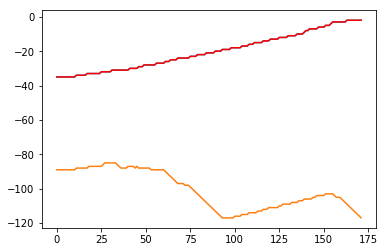

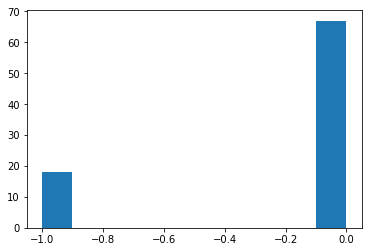

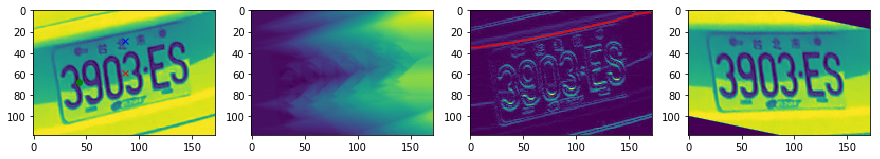

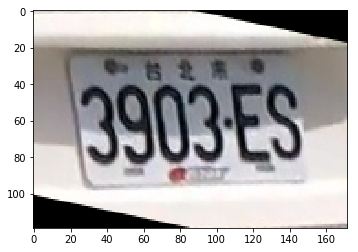

(171, 113)
(171, 113)
row=171, column=113


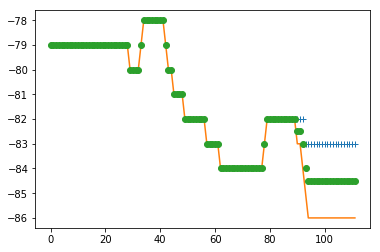

b=37,e=74
[21. 21. 21. 21. 21. 22. 22. 22. 22. 22. 22. 22. 22. 23. 23. 23. 23. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 25. 25. 25. 25. 25. 26. 26. 26. 26. 26.
 26.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36]
r_x_squared_down0.7761954494270958, r_x_squared_up=0.9651558153258213
data_r_x_down_center=141.0, data_r_x_up_center=24.0


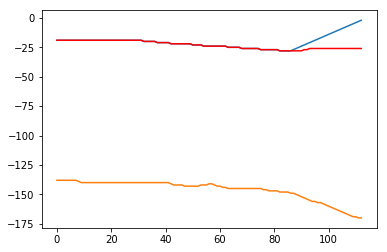

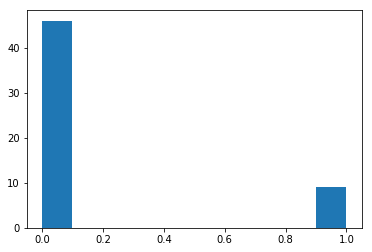

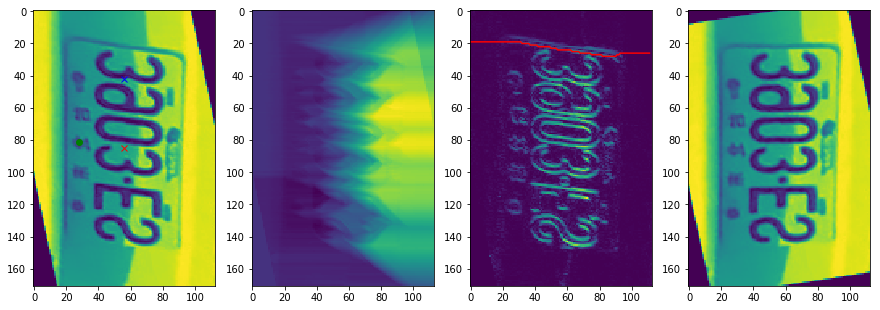

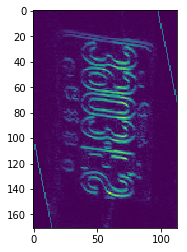

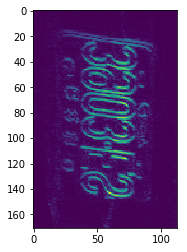

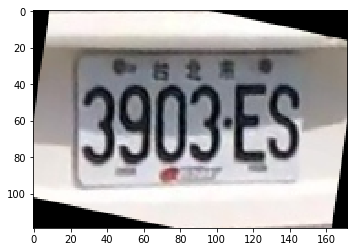

img/0_RAD9736_1.jpg


(146, 78)

36
109
26
52
row=77, column=146


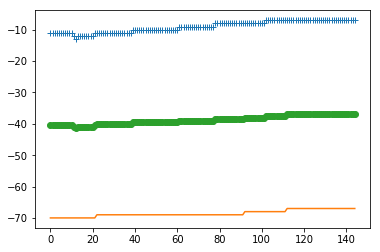

b=48,e=97
[10. 10. 10. 10. 10. 10. 10. 10. 10. 10. 10. 10. 10.  9.  9.  9.  9.  9.
  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  8.  8.  8.  8.  8.  8.
  8.  8.  8.  8.  8.  8.  8.  8.  8.  8.  8.  8.  8.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48]
r_x_squared_down0.2749999999999976, r_x_squared_up=0.8791155352480419
data_r_x_down_center=69.0, data_r_x_up_center=9.0


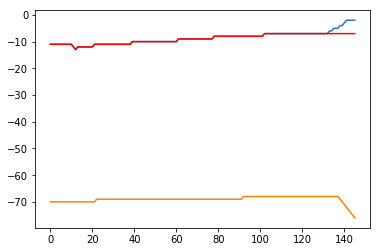

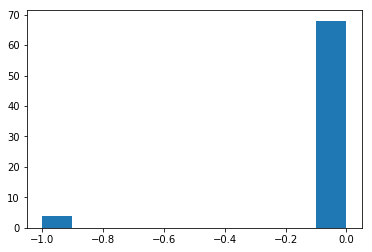

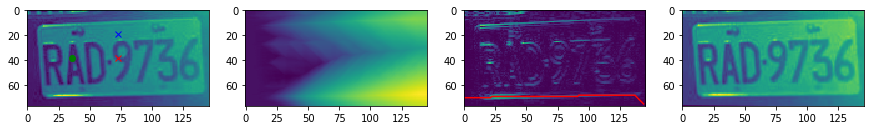

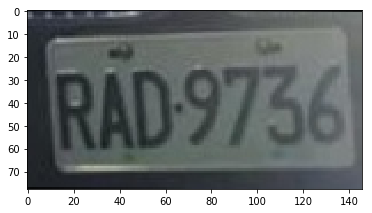

(145, 72)
(145, 72)
row=145, column=72


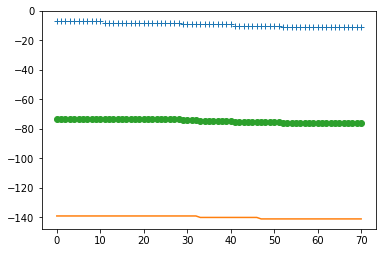

b=24,e=48
[ 8.  8.  8.  8.  8.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9.  9. 10.
 10. 10. 10. 10. 10. 10.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
r_x_squared_down0.7400395256916923, r_x_squared_up=0.8413227189222291
data_r_x_down_center=140.0, data_r_x_up_center=9.0


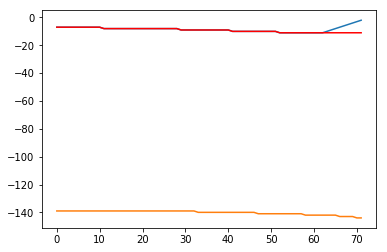

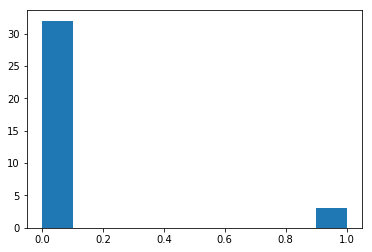

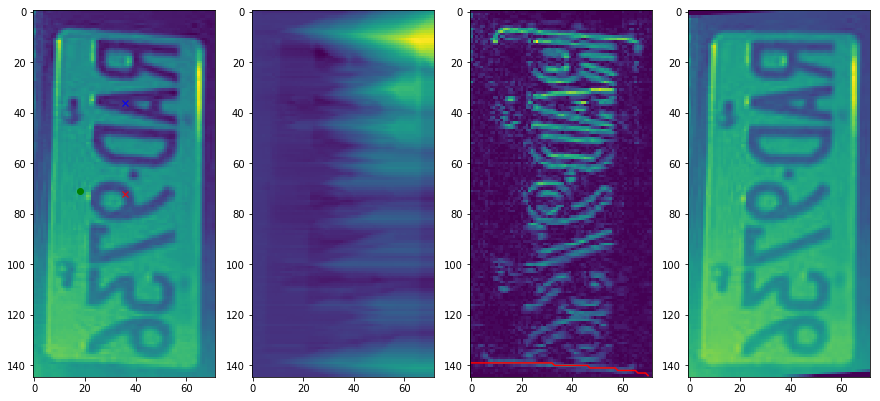

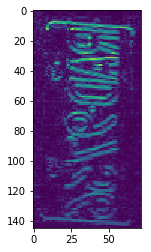

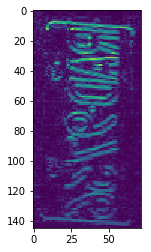

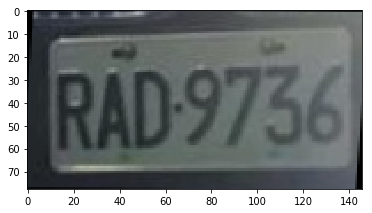

img/0_238KGR_1.jpg


(72, 63)

18
54
21
42
row=62, column=72


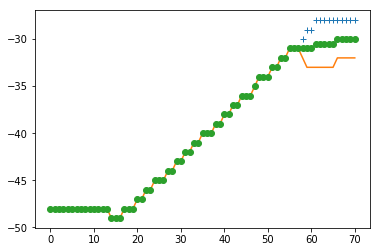

b=24,e=48
[12. 12. 12. 11. 11. 10. 10. 10.  9.  9.  8.  8.  8.  8.  8.  8.  8.  8.
  8.  8.  7.  6.  6.  6.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
r_x_squared_down0.7502666426123037, r_x_squared_up=0.9028262031464225
data_r_x_down_center=40.0, data_r_x_up_center=8.0


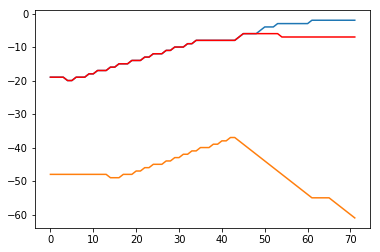

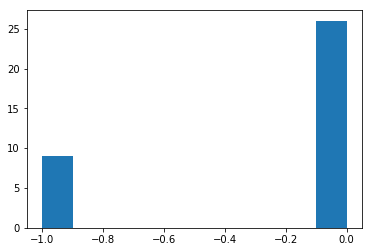

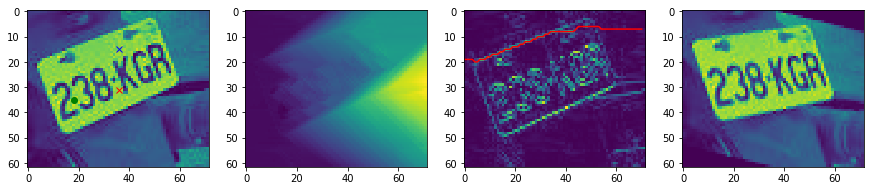

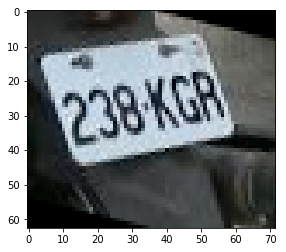

(71, 57)
(71, 57)
row=71, column=57


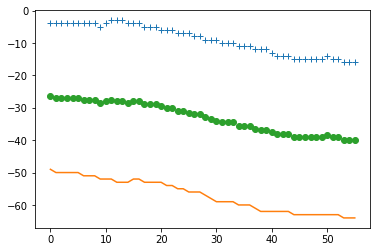

b=18,e=37
[ 5.  5.  6.  6.  6.  7.  7.  7.  8.  8.  9.  9.  9. 10. 10. 10. 11. 11.
 11.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
r_x_squared_down0.9709037037037037, r_x_squared_up=0.9796610169491525
data_r_x_down_center=57.0, data_r_x_up_center=9.0


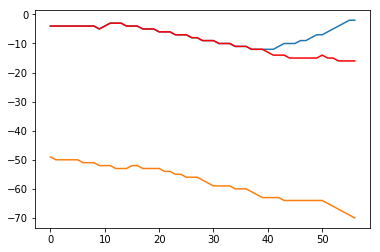

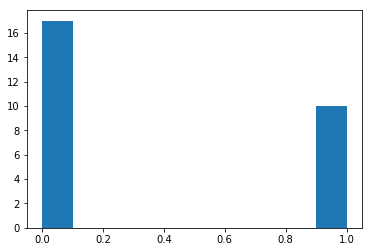

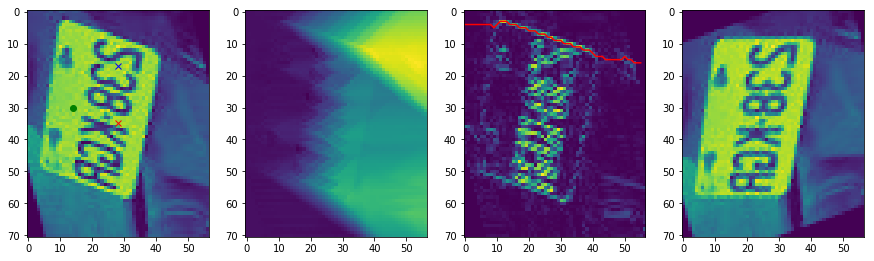

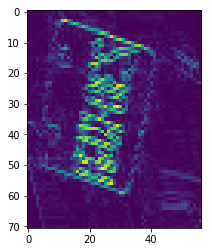

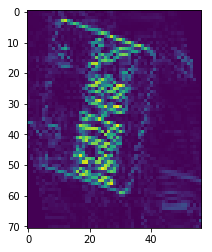

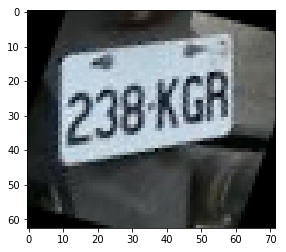

img/0_3903ES_1.jpg


(162, 167)

40
121
55
111
row=166, column=162


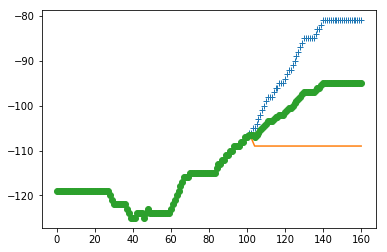

b=54,e=108
[49. 48. 47. 47. 47. 47. 46. 46. 46. 45. 44. 44. 44. 43. 43. 43. 42. 41.
 40. 40. 40. 39. 39. 39. 39. 39. 39. 38. 37. 37. 36. 36. 36. 35. 34. 33.
 32. 31. 31. 31. 31. 31. 31. 31. 30. 30. 30. 29. 29. 28. 28. 27. 26. 25.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53]
r_x_squared_down0.23269907259354042, r_x_squared_up=0.9897347880625426
data_r_x_down_center=115.0, data_r_x_up_center=38.0


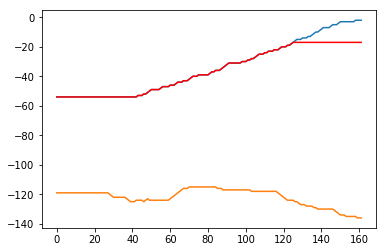

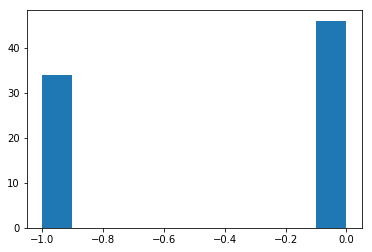

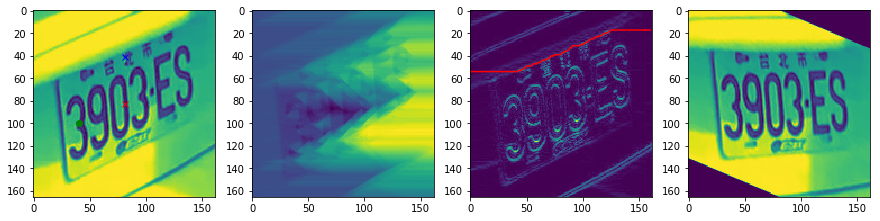

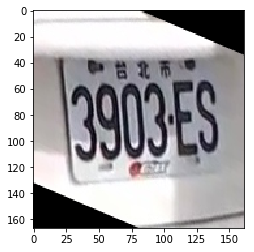

(161, 161)
(161, 161)
row=161, column=161


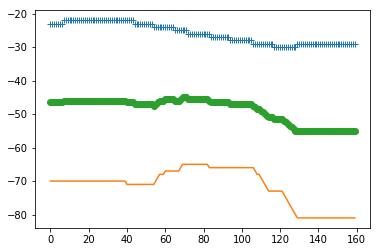

b=53,e=106
[23. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 25. 25. 25. 25. 25. 25.
 25. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 27. 27. 27. 27. 27.
 27. 27. 27. 27. 27. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52]
r_x_squared_down0.9336188068582436, r_x_squared_up=0.9552984615384615
data_r_x_down_center=109.0, data_r_x_up_center=26.0


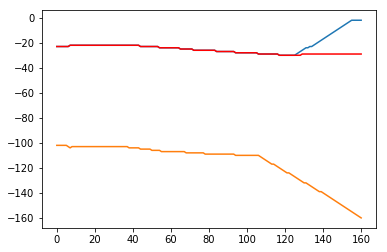

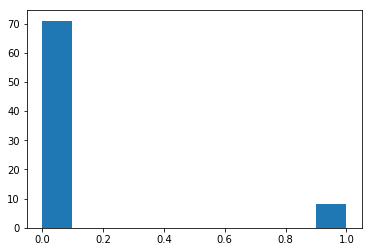

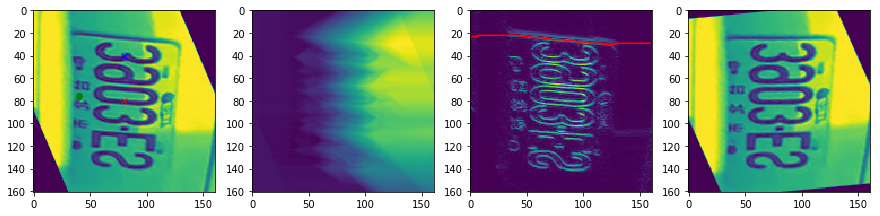

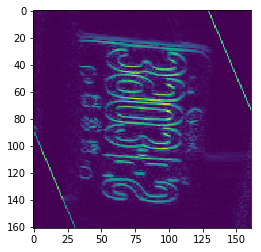

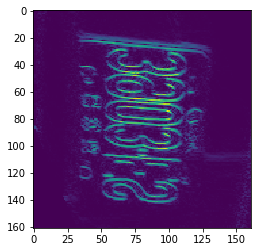

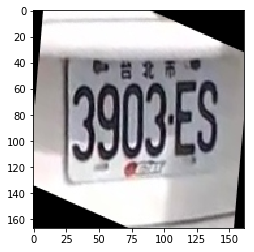

img/4258zx.jpeg


(109, 99)

27
81
33
66
row=98, column=109


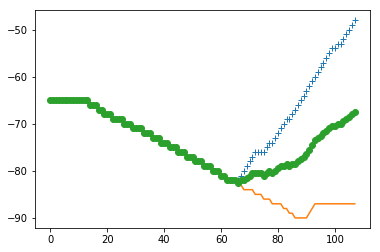

b=36,e=72
[5. 5. 5. 5. 5. 5. 5. 5. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 7.
 7. 6. 6. 6. 7. 7. 7. 7. 7. 7. 7. 7.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35]
r_x_squared_down0.9928874214588501, r_x_squared_up=0.7971623947527563
data_r_x_down_center=79.0, data_r_x_up_center=6.0


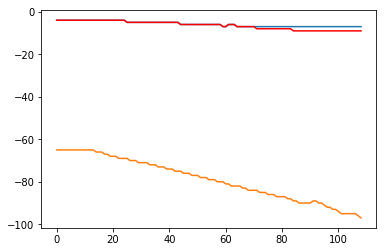

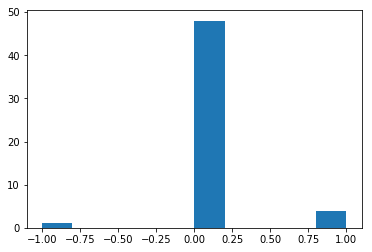

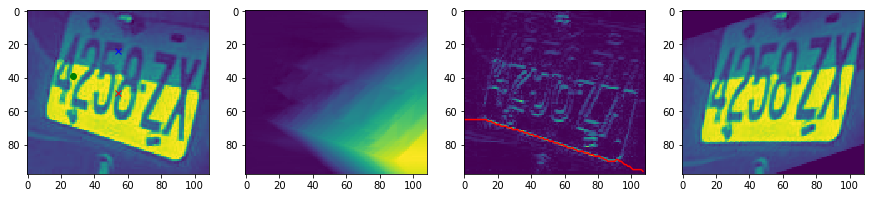

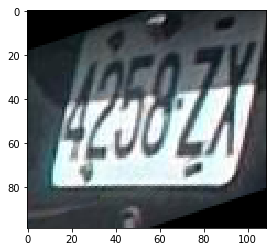

(108, 93)
(108, 93)
row=108, column=93


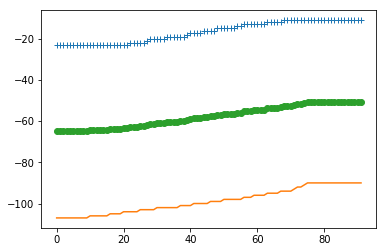

b=30,e=61
[20. 20. 20. 19. 19. 19. 19. 19. 19. 18. 17. 17. 17. 17. 16. 16. 16. 16.
 15. 15. 15. 15. 15. 15. 14. 14. 13. 13. 13. 13. 13.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]
r_x_squared_down0.9682592378752886, r_x_squared_up=0.9724526182102384
data_r_x_down_center=99.0, data_r_x_up_center=16.0


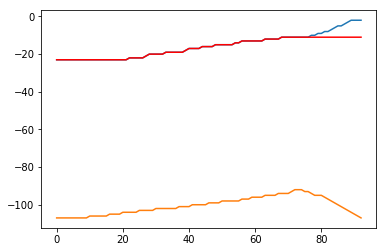

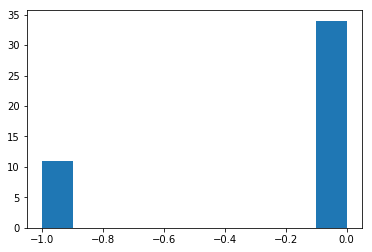

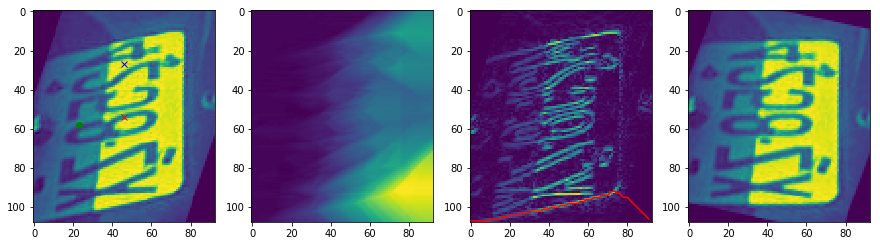

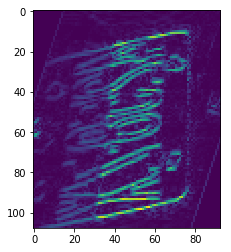

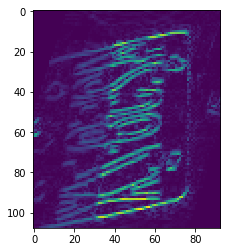

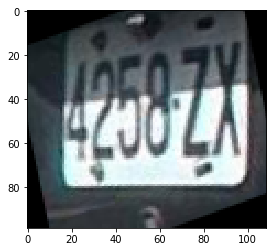

img/0_5567WK_1.jpeg


(144, 91)

36
108
30
60
row=90, column=144


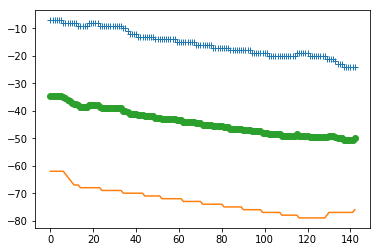

b=48,e=96
[13. 14. 14. 14. 14. 14. 14. 14. 14. 14. 14. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 16. 16. 16. 16. 16. 16. 16. 16. 15. 14. 14. 13. 12. 11. 10.  9.
  8.  7.  6.  5.  4.  3.  2.  1.  1.  1.  1.  1.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47]
r_x_squared_down0.9642857142857142, r_x_squared_up=0.9639784486245098
data_r_x_down_center=74.0, data_r_x_up_center=16.0


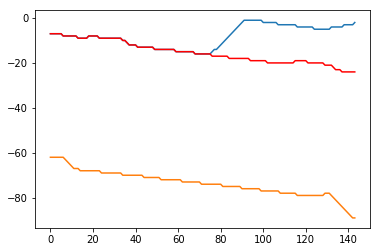

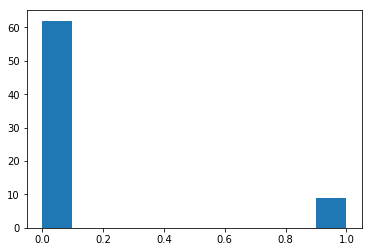

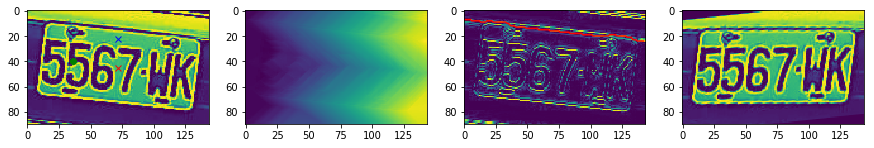

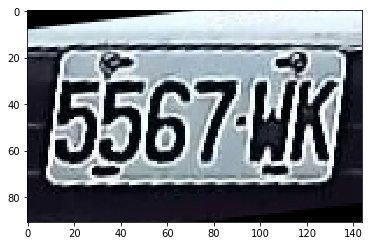

(143, 85)
(143, 85)
row=143, column=85


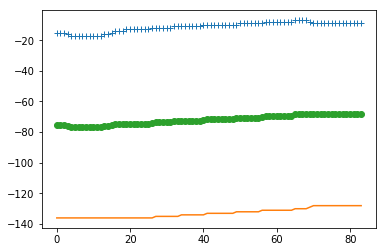

b=28,e=56
[12. 12. 12. 12. 11. 11. 11. 11. 11. 11. 11. 11. 10. 10. 10. 10. 10. 10.
 10. 10. 10. 10.  9.  9.  9.  9.  9.  9.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]
r_x_squared_down0.9356821589205396, r_x_squared_up=0.913327120223672
data_r_x_down_center=133.0, data_r_x_up_center=10.0


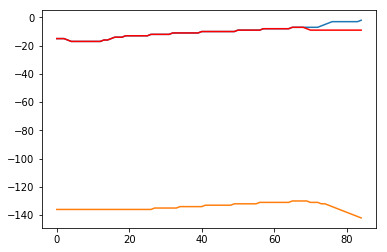

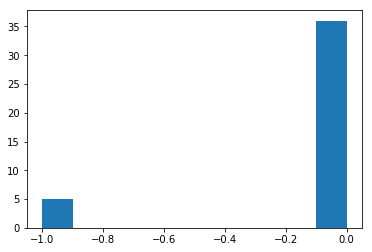

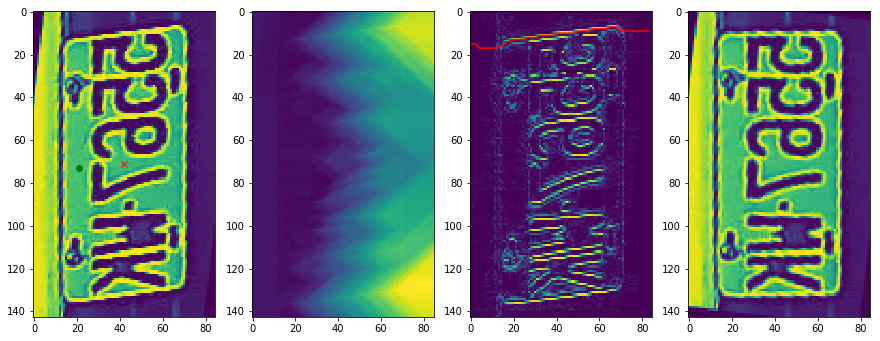

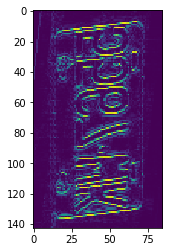

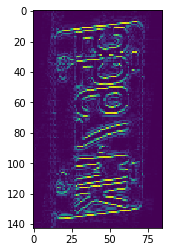

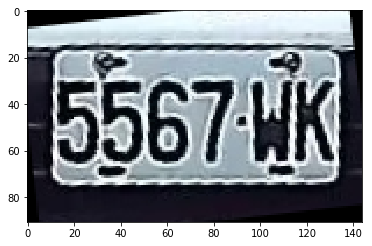

img/0_2326YG_1.jpg


(66, 53)

16
49
17
35
row=52, column=66


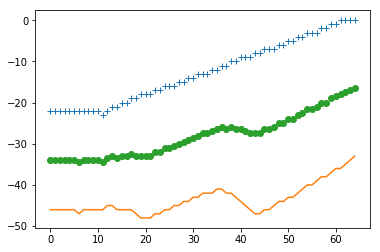

b=22,e=44
[17. 17. 16. 16. 16. 15. 15. 14. 14. 13. 13. 13. 12. 12. 11. 11. 10. 10.
  9.  9.  9.  8.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]
r_x_squared_down0.10662469156810984, r_x_squared_up=0.989066713172263
data_r_x_down_center=42.0, data_r_x_up_center=13.0


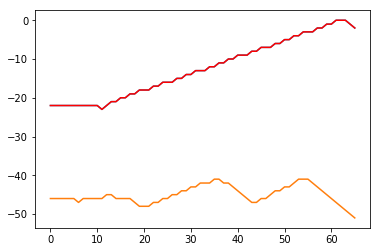

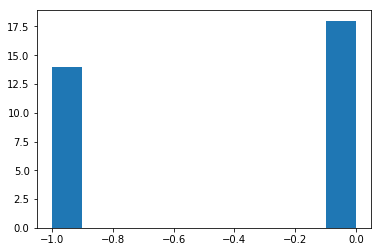

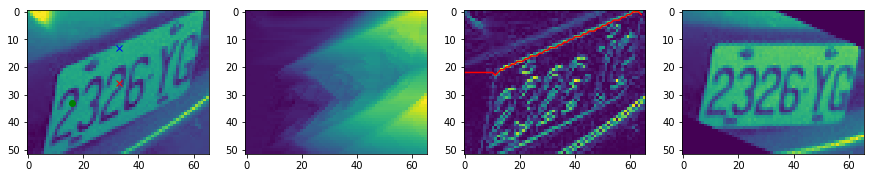

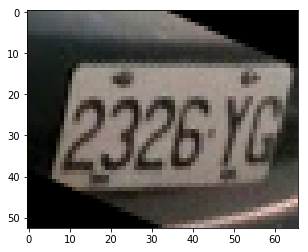

(65, 47)
(65, 47)
row=65, column=47


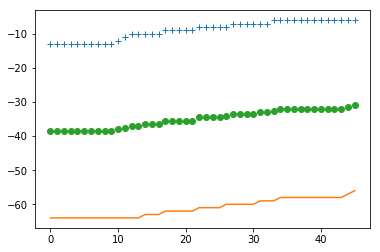

b=15,e=30
[10. 10.  9.  9.  9.  9.  9.  8.  8.  8.  8.  8.  7.  7.  7.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]
r_x_squared_down0.9244565217391306, r_x_squared_up=0.9141281512605041
data_r_x_down_center=61.0, data_r_x_up_center=8.0


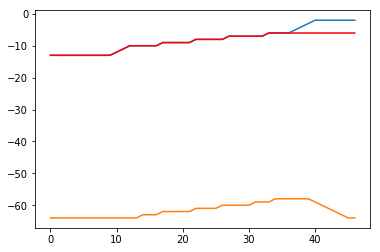

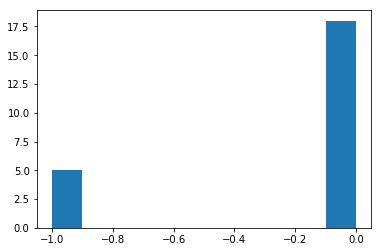

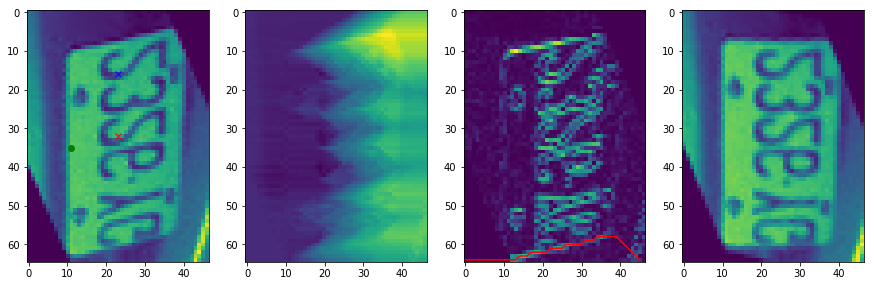

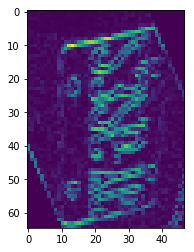

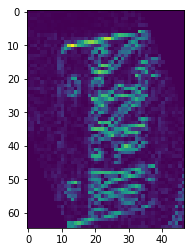

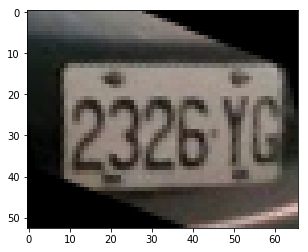

img/0_3333X5_1.jpg


(51, 47)

12
38
15
31
row=46, column=51


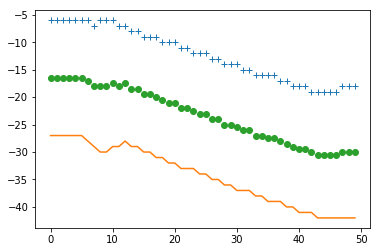

b=16,e=33
[ 9.  9. 10. 10. 10. 11. 11. 12. 12. 12. 13. 13. 14. 14. 14. 15. 15.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]
r_x_squared_down0.9820443645083933, r_x_squared_up=0.9803921568627451
data_r_x_down_center=34.0, data_r_x_up_center=12.0


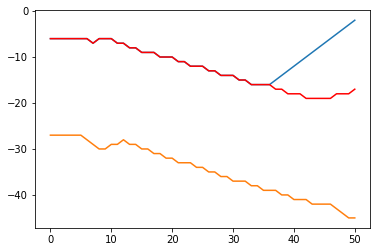

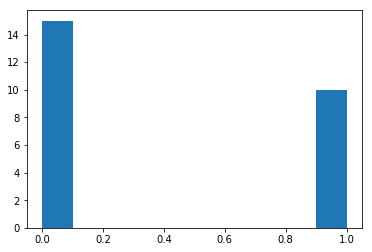

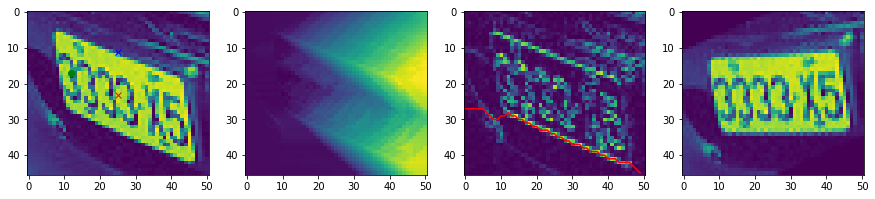

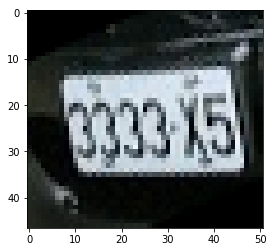

(50, 41)
(50, 41)
row=50, column=41


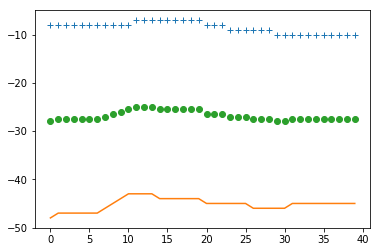

b=13,e=26
[7. 7. 7. 7. 7. 7. 7. 8. 8. 8. 9. 9. 9.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
r_x_squared_down0.7889610389610398, r_x_squared_up=0.81203007518797
data_r_x_down_center=45.0, data_r_x_up_center=8.0


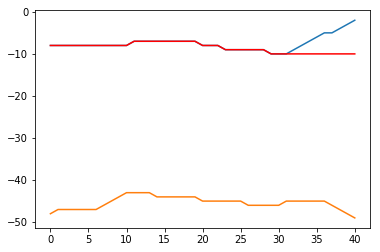

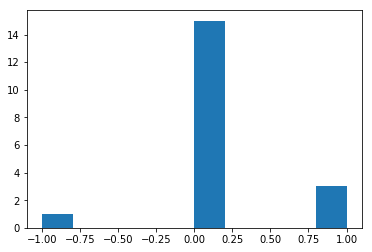

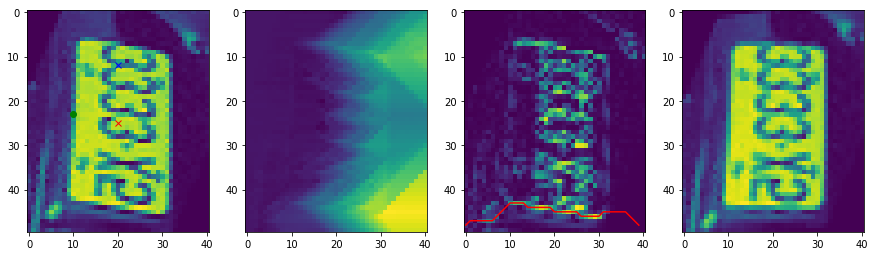

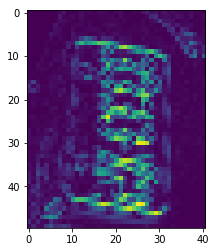

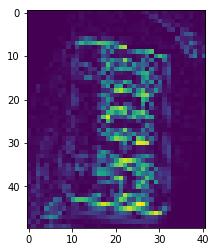

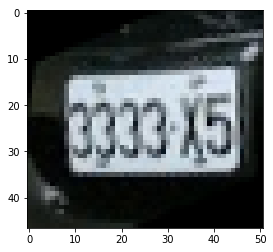

img/0_8993QZ_2.jpg


(62, 42)

15
46
14
28
row=41, column=62


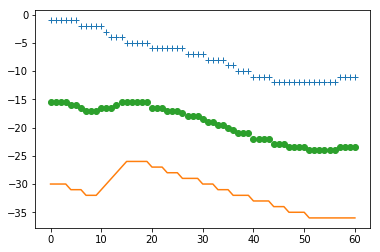

b=20,e=41
[ 6.  6.  6.  6.  6.  6.  6.  7.  7.  7.  7.  8.  8.  8.  8.  9.  9. 10.
 10. 10. 11.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]
r_x_squared_down0.9755860101699121, r_x_squared_up=0.9185188229492027
data_r_x_down_center=30.0, data_r_x_up_center=8.0


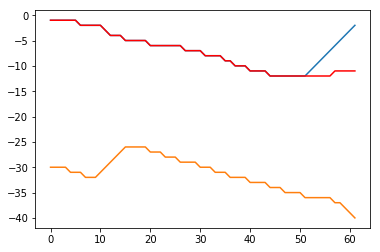

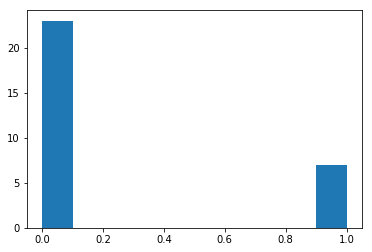

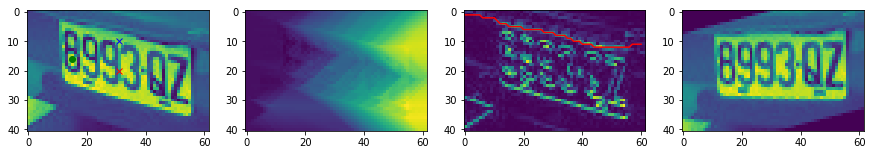

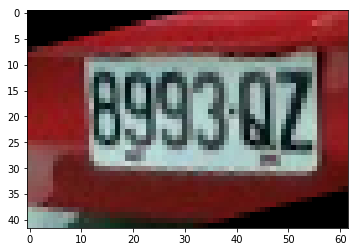

(61, 36)
(61, 36)
row=61, column=36


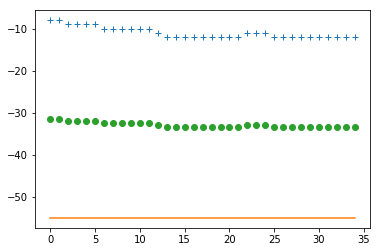

b=12,e=24
[11. 12. 12. 12. 12. 12. 12. 12. 12. 12. 11. 11.]
[ 0  1  2  3  4  5  6  7  8  9 10 11]
r_x_squared_down1.0, r_x_squared_up=0.06293706293706358
data_r_x_down_center=55.0, data_r_x_up_center=12.0


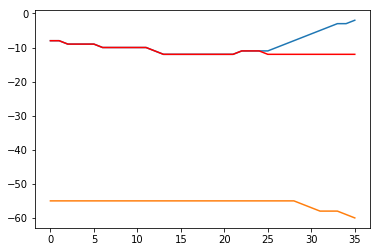

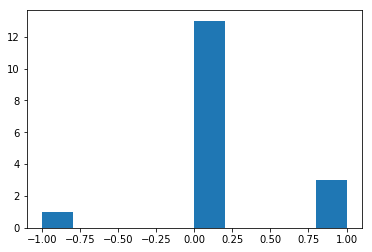

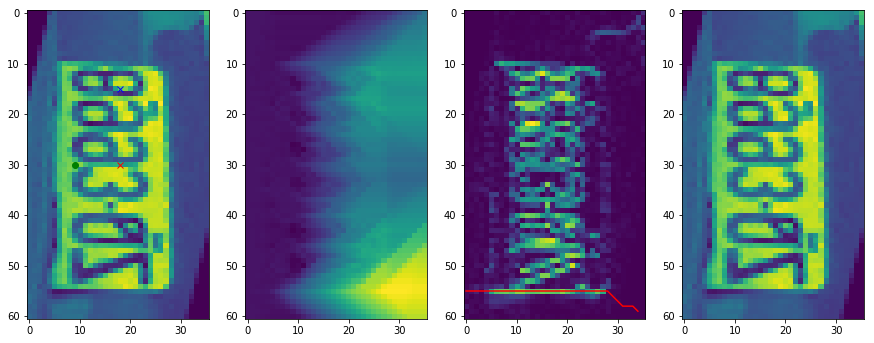

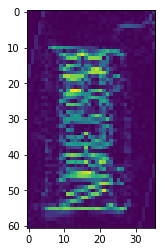

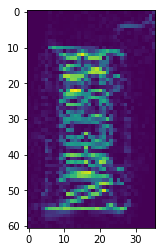

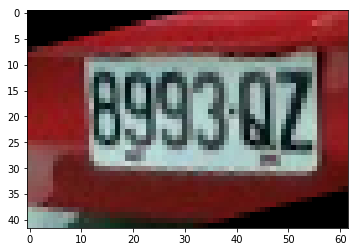

img/0_9888X3_3.jpg


(134, 112)

33
100
37
74
row=111, column=134


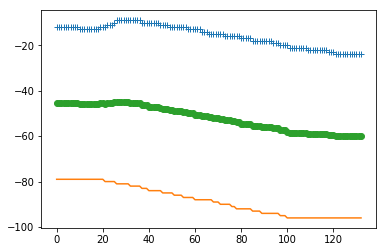

b=44,e=89
[10. 11. 11. 11. 11. 12. 12. 12. 12. 12. 12. 12. 12. 13. 13. 13. 13. 13.
 13. 14. 14. 14. 15. 15. 15. 15. 15. 15. 15. 16. 16. 16. 16. 16. 16. 16.
 17. 17. 17. 17. 17. 18. 18. 18. 18.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
r_x_squared_down0.9814099486224628, r_x_squared_up=0.97856264787711
data_r_x_down_center=88.0, data_r_x_up_center=15.0


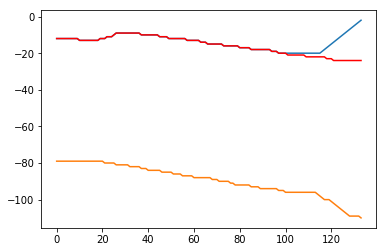

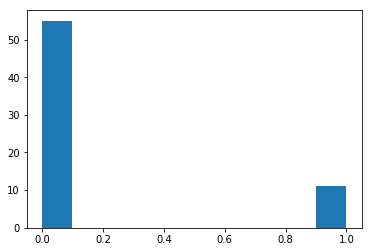

In [ ]:

def looAll(path):
    lpRect_s=[]
    pix_gray_s=[]
    imWrap_s=[]
    imWrap_t_wrap_t_s=[]
    lpCount=0
    for root,unkown,fNames in os.walk(path):
        for f in fNames:
            lpCount=lpCount+1
            strFpath="{}/{}".format(path,f)
            print(strFpath)
            lpRect, pix_gray, a, imWrap, imWrap_t_wrap_t, cropGrayLR=lp_parser(strFpath, 413, 178, 472, 737, True)
            lpRect_s.append(lpRect)
            pix_gray_s.append(pix_gray)
            imWrap_s.append(imWrap)
            imWrap_t_wrap_t_s.append(imWrap_t_wrap_t)
    return lpRect_s, pix_gray_s, imWrap_s, imWrap_t_wrap_t_s, cropGrayLR

lpRect_s, pix_gray_s, imWrap_s, imWrap_t_wrap_t_s, cropGrayLR= looAll('img')
#%lprun -f looAll('img')


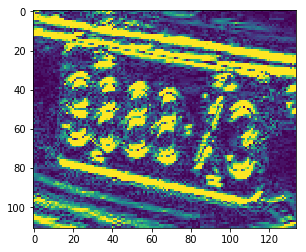

In [133]:
#x=[[np.ones(cropGrayLR.shape)] , [np.ones(cropGrayLR.shape)]]
#x=np.concatenate((np.ones(cropGrayLR.shape),np.ones(cropGrayLR.shape)),axis=2)
cropGrayLR.shape[0]
x=np.ones((cropGrayLR.shape[0],cropGrayLR.shape[1],2))*20.00
x[:,:,0]=cropGrayLR
plt.imshow(np.min(x,axis=2))



In [ ]:
print(len(imWrap_s))
print(int(len(imWrap_s)/6))
#pix_gray_s
plt.subplots(int(len(imWrap_s)/6)+1,6,figsize=(15,10))
    
for ii in range(0,len(imWrap_s)):
    plt.subplot(int(len(imWrap_s)/6)+1,6,ii+1)
    plt.imshow(imWrap_s[ii])
    
plt.show()

28


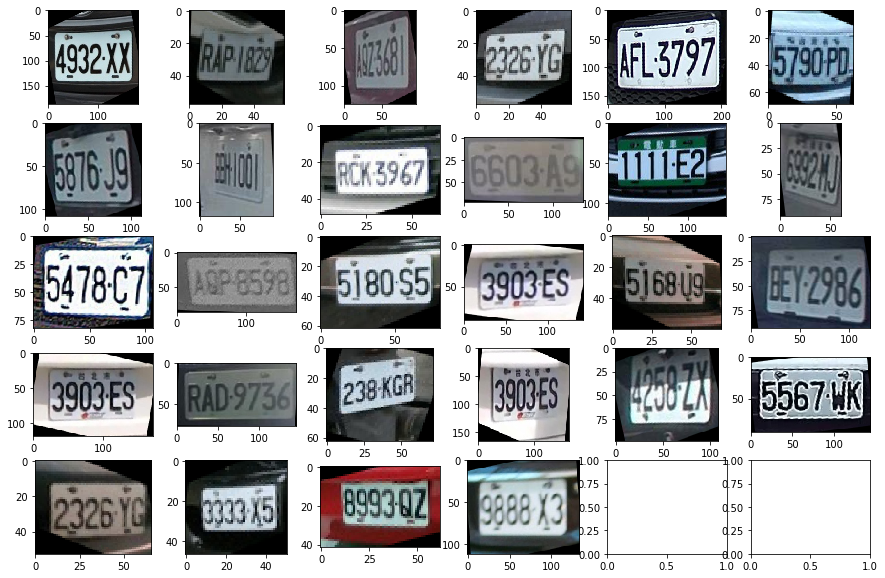

In [78]:
print(len(imWrap_t_wrap_t_s))
#pix_gray_s
plt.subplots(int(len(imWrap_s)/6)+1,6,figsize=(15,10))
    
for ii in range(0,len(imWrap_t_wrap_t_s)):
    plt.subplot(int(len(imWrap_s)/6)+1,6,ii+1)
    plt.imshow(imWrap_t_wrap_t_s[ii])
    
plt.show()

(72, 63)

18
54
21
42
row=62, column=72
19.627788485663082
b=24,e=48
[12. 12. 12. 11. 11. 10. 10. 10.  9.  9.  8.  8.  8.  7.  8.  8.  8.  8.
  8.  9. 10. 11. 12. 13.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
r_x_squared_down0.977060355341662, r_x_squared_up=0.04821070234113756
data_r_x_down_center=40.0, data_r_x_up_center=8.0


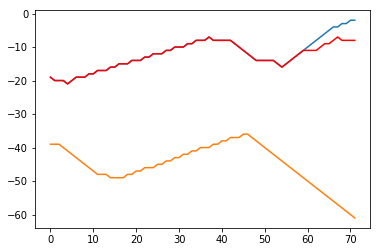

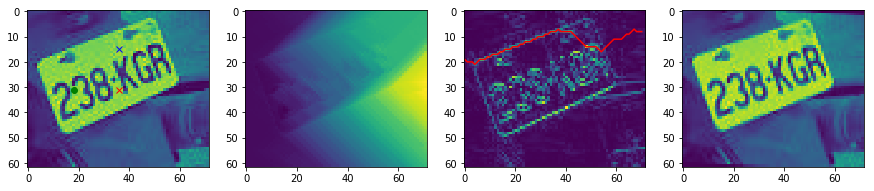

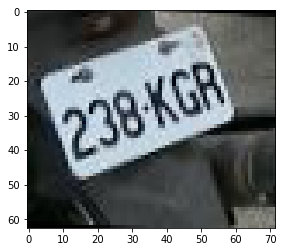

(71, 57)
(71, 57)
row=71, column=57
19.89715149493452
b=18,e=37
[ 3.  3.  4.  4.  4.  5.  5.  6.  6.  6.  7.  7.  7.  8.  8.  9.  9.  9.
 10.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]
r_x_squared_down0.82469320066335, r_x_squared_up=0.9822486441385067
data_r_x_down_center=58.0, data_r_x_up_center=7.0


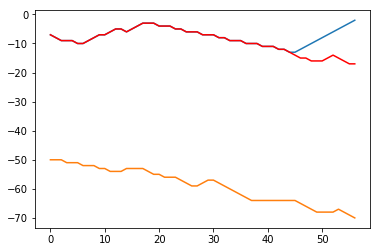

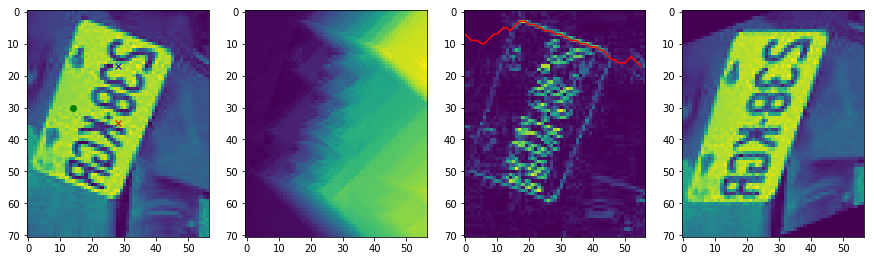

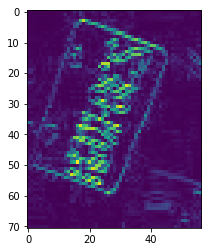

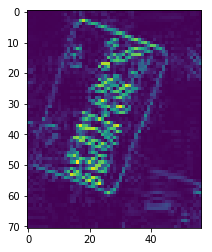

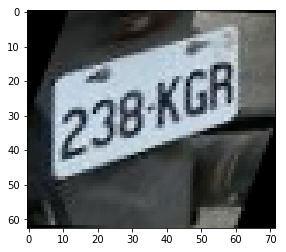

(array([ 7.,  8.,  9.,  9.,  9., 10., 10.,  9.,  8.,  7.,  7.,  6.,  5.,
         5.,  6.,  5.,  4.,  3.,  3.,  3.,  4.,  4.,  4.,  5.,  5.,  6.,
         6.,  6.,  7.,  7.,  7.,  8.,  8.,  9.,  9.,  9., 10., 10., 10.,
        11., 11., 11., 12., 12., 13., 14., 15., 15., 16., 16., 16., 15.,
        14., 15., 16., 17., 17.]),
 array([[ 44.2837,  47.2834,  50.2831, ...,  69.0101,  75.0095,  70.01  ],
        [ 44.2837,  45.2836,  46.2835, ...,  72.0098,  75.0095,  70.01  ],
        [ 42.2839,  41.284 ,  40.2841, ...,  77.0093,  79.0091,  72.0098],
        ...,
        [ 20.0473,  13.048 ,   6.0487, ..., 132.0747, 141.0738, 136.7152],
        [ 11.0482,   7.0486,   3.049 , ..., 125.0754, 110.0769, 112.0767],
        [  5.0488,   4.0489,   5.0488, ..., 135.0744, 121.0758, 106.0773]]),
 array([[-0.05391304]]),
 array([[[ 41,  43,  42],
         [ 41,  43,  42],
         [ 40,  42,  41],
         ...,
         [  0,   0,   0],
         [  0,   0,   0],
         [  0,   0,   0]],
 
        [[

In [39]:
#!ls
#!pip install  line_profiler
#!python -m pip install --upgrade pip
testPath='img/0_238KGR_1.jpg'
lp_parser(testPath, 413, 178, 472, 737,True)

In [34]:
testPath='img/0_3333X5_1.jpg'
testPath='img/0_5790PD_1.jpg'
lpRect_s=[]
pix_gray_s=[]
imWrap_s=[]
imWrap_t_wrap_t_s=[]
#lp_parser(testPath, 413, 178, 472, 737)

%lprun -f dpDdecode lp_parser(testPath, 413, 178, 472, 737,False)


15
47
23
46
row=68, column=63
24.623517250233427
b=20,e=41
[21. 21. 20. 20. 20. 19. 19. 18. 18. 18. 17. 17. 17. 16. 16. 15. 15. 14.
 14. 14. 13.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]
r_x_squared_down0.9828850014338973, r_x_squared_up=0.9853152320705096
data_r_x_down_center=61.0, data_r_x_up_center=17.0
(62, 63)
(62, 63)
row=62, column=63
21.076622375832052
b=20,e=41
[21. 21. 21. 21. 21. 21. 21. 21. 21. 21. 20. 20. 20. 20. 20. 19. 19. 19.
 19. 19. 19.]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]
r_x_squared_down0.5402667984189726, r_x_squared_up=0.8522727272727274
data_r_x_down_center=58.0, data_r_x_up_center=20.0


In [ ]:
#using sympy

from sympy import *

def linear_regression(X, Y):
    a, b = symbols('a b')
    residual = 0
    #residualSum 求殘差

    for i in range(num):
        residual += (Y[i] - (a * X[i] + b)) ** 2

    #展開觀看方程式內容

    print expand(residual)
    #對a微分

    f1 = diff(residual, a)
    #對b微分

    f2 = diff(residual, b)
    print f1
    print f2
    #求聯立方程式的解

    res = solve([f1, f2], [a, b])
    return res[a], res[b]

a, b = linear_regression(data_X, data_Y)